In [1]:
#Anoamalie dans fenetre de la cuisine 


In [11]:
import pandas as pd 
import matplotlib.pyplot as plt 
import numpy as np 
import seaborn as sns 
#from pandas_profiling import ProfileReport 
#import sweetviz as sv
#import dtale
import warnings
warnings.filterwarnings("ignore")
from sklearn.model_selection import train_test_split
from sklearn.metrics import f1_score,confusion_matrix,classification_report
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier
#from sklearn.pipeline import make_pipeline
from sklearn.model_selection import learning_curve
from sklearn.preprocessing import MinMaxScaler
import pandas as pd
import xgboost as xgb


In [12]:
DecisionTreeClassifier =DecisionTreeClassifier(random_state=0)
RandomForest =RandomForestClassifier(n_estimators=100, random_state=0,)
AdaBoost = AdaBoostClassifier(random_state=0)
Regression_logistic=LogisticRegression(random_state = 0)
SVM = SVC(random_state=0)
KNN = KNeighborsClassifier()
XGboost = XGBClassifier()

In [13]:
dict_of_models = {'DecisionTreeClassifier':DecisionTreeClassifier,
                  'RandomForest': RandomForest,
                  'AdaBoost' : AdaBoost,
                  'XGboost':XGboost,
                  'Regression_logistic':Regression_logistic,
                  'SVM': SVM,
                  'KNN': KNN
                  
                 }

In [14]:
def evaluation(model):
    
    model.fit(X1_train, y1_train)
    ypred = model.predict(X1_test)
    
    print(confusion_matrix(y1_test, ypred))
    print(classification_report(y1_test, ypred))
    print('=======================================================')

In [15]:
def evaluation2(model):
    
    model.fit(X2_train, y2_train)
    y2pred = model.predict(X2_test)
    
    print(confusion_matrix(y2_test, y2pred))
    print(classification_report(y2_test, y2pred))
    print('=======================================================')

In [16]:
def evaluation3(model):
    
    model.fit(X3_train, y3_train)
    y3pred = model.predict(X3_test)
    
    print(confusion_matrix(y3_test, y3pred))
    print(classification_report(y3_test, y3pred))
    print('=======================================================')

In [17]:
def evaluation_c(model):
    
    model.fit(Xc_train, yc_train)
    ycpred = model.predict(Xc_test)
    
    print(confusion_matrix(yc_test, ycpred))
    print(classification_report(yc_test, ycpred))
    print('=======================================================')

In [18]:
def evaluation_s(model):
    
    model.fit(Xs_train, ys_train)
    yspred = model.predict(Xs_test)
    
    print(confusion_matrix(ys_test, yspred))
    print(classification_report(ys_test, yspred))
    print('=======================================================')

In [19]:
def evaluation_t(model):
    
    model.fit(Xt_train, yt_train)
    ytpred = model.predict(Xt_test)
    
    print(confusion_matrix(yt_test, ytpred))
    print(classification_report(yt_test, ytpred))
    print('=======================================================')

In [20]:
def importance(evaluation,X):
    for name,model in dict_of_models.items():
        liste=['Regression_logistic','KNN','SVM']
        if name in liste:
            print(name)
            evaluation(model)
        else:
            print(name)
            evaluation(model)
            O=pd.DataFrame(model.feature_importances_,index=X.columns)
            O.columns=['importance']
            O.sort_values(by='importance',inplace=True,ascending=False)
            display(O)

In [21]:
df1 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_ValloniereR4_Ben_fen_ch1_all.txt',delimiter="\t")
df2 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_ValloniereR4_Ben_fen_ch2_all.txt',delimiter="\t")
df3 = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_ValloniereR4_Ben_fen_ch3_all.txt',delimiter="\t")
dfc = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_ValloniereR4_Ben_fen_cuisine_all.txt',delimiter="\t")
dfs = pd.read_csv('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_ValloniereR4_Ben_fen_salon_all.txt',delimiter="\t")


In [22]:
meteo =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_meteo.xlsx')
meteo1 =pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Donnees_meteo.xlsx',index_col='Date')

In [23]:
df11=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Fenetres_Valloniere_R4.xlsx',sheet_name = "Ch1",index_col='Date')
df22=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Fenetres_Valloniere_R4.xlsx',sheet_name = "Ch2",index_col='Date')
df33=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Fenetres_Valloniere_R4.xlsx',sheet_name = "Ch3",index_col='Date')
dfc1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Fenetres_Valloniere_R4.xlsx',sheet_name = "Cuisine",index_col='Date')
dfs1=pd.read_excel('C:/Users/yazid.aissaoui/Desktop/Stage/Valloniere/Valloniere/Fenetres_Valloniere_R4.xlsx',sheet_name = "Salon",index_col='Date')
df=pd.concat([df11,df22,df33,dfc1,dfs1],axis=1)
#df = df.loc[:,~df.columns.duplicated()]
df.dropna(axis = 0, how = 'any',inplace=True)

print('#========================== CHAMBRE 1  ============================#')
print('date de début d enregistrement des données')
display(df11.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df11.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df11.shape)
print('\n')
print('#========================== CHAMBRE 2  ============================#')
print('date de début d enregistrement des données')
display(df22.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df22.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df22.shape)
print('\n')
print('#========================== CHAMBRE 3  ============================#')
print('date de début d enregistrement des données')
display(df33.index.min()),print('          ----------')
print('date de fin d enregistrement des données')
display(df33.index.max()),print('          ----------')
print('la dimension du dataframe de la chambre  et de:' , )
display(df33.shape)
print('\n')
print('#========================== CUISINE ==============================#')
print('date de début d enregistrement des données')
display(dfc1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfc1.index.max()),print('         ----------')
print('la dimension du dataframe de la cuisine et de:' , )
display(dfc1.shape)
print('\n')
print('#========================== SALON ================================#')
print('date de début d enregistrement des données')
display(dfs1.index.min()),print('         ----------')
print('date de fin d enregistrement des données')
display(dfs1.index.max()),print('         ----------')
print('la dimension du dataframe du salon et de:' , )
display(dfs1.shape)
print('\n')
print('#======== df résultat de concatination (ch1,ch2,cuisine,salon) =========#')
print('date de début')  
display(df.index.min()),print('         ----------')
print('date de fin')
display(df.index.max()),print('         ----------')
print('la dimension de df :' , )
display(df.shape)
print('\n')
print('                                                   df')
display(df )
      

#========================== CHAMBRE 1  ============================#
date de début d enregistrement des données


Timestamp('2021-01-11 17:30:00')

          ----------
date de fin d enregistrement des données


Timestamp('2021-02-25 17:20:00')

          ----------
la dimension du dataframe de la chambre  et de:


(12959, 4)



#========================== CHAMBRE 2  ============================#
date de début d enregistrement des données


Timestamp('2021-01-11 17:40:00')

          ----------
date de fin d enregistrement des données


Timestamp('2021-02-25 17:20:00')

          ----------
la dimension du dataframe de la chambre  et de:


(12957, 4)



#========================== CHAMBRE 3  ============================#
date de début d enregistrement des données


Timestamp('2021-01-11 17:35:00')

          ----------
date de fin d enregistrement des données


Timestamp('2021-02-25 17:20:00')

          ----------
la dimension du dataframe de la chambre  et de:


(12958, 4)



#========================== CUISINE ==============================#
date de début d enregistrement des données


Timestamp('2021-01-11 17:25:00')

         ----------
date de fin d enregistrement des données


Timestamp('2021-02-25 17:15:00')

         ----------
la dimension du dataframe de la cuisine et de:


(12959, 3)



#========================== SALON ================================#
date de début d enregistrement des données


Timestamp('2021-01-11 17:20:00')

         ----------
date de fin d enregistrement des données


Timestamp('2021-02-25 17:15:00')

         ----------
la dimension du dataframe du salon et de:


(12960, 4)



#======== df résultat de concatination (ch1,ch2,cuisine,salon) =========#
date de début


Timestamp('2021-01-11 17:40:00', freq='5T')

         ----------
date de fin


Timestamp('2021-02-25 17:15:00', freq='5T')

         ----------
la dimension de df :


(12956, 19)



                                                   df


,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_ch3,T_ch3,HR_ch3,CO2_ch3,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,,,,,
2021-01-11 17:40:00,1.0,22.1,33.0,863.0,1.0,23.5,33.0,945.0,0.0,22.6,31.0,863.0,1.0,23.569,32.595,1.0,21.8,34.0,898.0
2021-01-11 17:45:00,1.0,22.1,33.0,863.0,1.0,23.5,33.0,945.0,0.0,22.6,31.0,863.0,1.0,23.569,32.595,1.0,21.8,34.0,898.0
2021-01-11 17:50:00,1.0,22.3,31.0,780.0,1.0,23.9,31.0,803.0,0.0,22.9,29.0,837.0,1.0,23.472,32.352,1.0,22.2,33.0,848.0
2021-01-11 17:55:00,1.0,22.3,31.0,780.0,1.0,23.9,31.0,803.0,1.0,22.9,29.0,837.0,1.0,23.472,32.352,1.0,22.2,33.0,848.0
2021-01-11 18:00:00,1.0,22.4,31.0,791.0,1.0,24.2,31.0,943.0,0.0,23.2,29.0,989.0,1.0,23.472,32.553,1.0,22.4,33.0,829.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-25 16:55:00,0.0,24.0,42.0,937.0,0.0,24.2,37.0,733.0,0.0,23.9,40.0,709.0,0.0,19.746,38.034,1.0,24.2,40.0,708.0
2021-02-25 17:00:00,0.0,24.0,42.0,937.0,0.0,24.2,36.0,681.0,0.0,23.9,39.0,643.0,0.0,19.674,38.091,1.0,24.2,39.0,629.0
2021-02-25 17:05:00,0.0,24.0,42.0,937.0,0.0,24.2,36.0,681.0,0.0,23.9,39.0,643.0,0.0,19.674,38.091,1.0,24.2,39.0,629.0


In [16]:
print('    ##================ info df1 ==============##'),df1.info(),print('    ##================ info df2 ==============##'),df2.info(),print('    ##================ info df3 ==============##'),df3.info(),print('    ##================ info dfc ==============##'),dfc.info(),print('    ##================ info dfs ==============##'),dfs.info(),print('    ##================ info meteo ==============##'),meteo.info(),print('    ##================ info df ==============##'),df.info()

    ##================ info df1 ==============##
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12959 entries, 0 to 12958
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           12959 non-null  object
 1   fen_chambre 1  12959 non-null  int64 
 2   T_ch1          12959 non-null  object
 3   HR_ch1         12959 non-null  int64 
 4   CO2_ch1        12959 non-null  int64 
dtypes: int64(3), object(2)
memory usage: 506.3+ KB
    ##================ info df2 ==============##
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12957 entries, 0 to 12956
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   Date           12957 non-null  object
 1   fen_chambre 2  12957 non-null  int64 
 2   T_ch2          12957 non-null  object
 3   HR_ch2         12957 non-null  int64 
 4   CO2_ch2        12957 non-null  int64 
dtypes: int64(3), object(2)
memo

(None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None)

In [24]:
#======================================#
A=meteo.loc[meteo['Date'].isin(df1['Date'])]
B=meteo.loc[meteo['Date'].isin(df2['Date'])]
E=meteo.loc[meteo['Date'].isin(df3['Date'])]
C=meteo.loc[meteo['Date'].isin(dfc['Date'])]
D=meteo.loc[meteo['Date'].isin(dfs['Date'])]
#=======================================#
AA=A.reset_index()
BB=B.reset_index()
CC=C.reset_index()
DD=D.reset_index()
EE=E.reset_index()
#=======================================#
AA.drop(['index'],axis=1,inplace=True)
BB.drop(['index'],axis=1,inplace=True)
CC.drop(['index'],axis=1,inplace=True)
DD.drop(['index'],axis=1,inplace=True)
EE.drop(['index'],axis=1,inplace=True)
#=======================================#
df1=pd.concat([AA,df1],axis=1)
df1 = df1.loc[:,~df1.columns.duplicated()]
          #================#
df2=pd.concat([BB,df2],axis=1)
df2 = df2.loc[:,~df2.columns.duplicated()]
          #================#
df3=pd.concat([EE,df3],axis=1)
df3 = df3.loc[:,~df3.columns.duplicated()]
          #================#      
dfc=pd.concat([CC,dfc],axis=1)
dfc = dfc.loc[:,~dfc.columns.duplicated()]
          #================#
dfs=pd.concat([DD,dfs],axis=1)
dfs = dfs.loc[:,~dfs.columns.duplicated()]
#=======================================#


In [25]:
df1['T_ch1'].replace(',','.',regex=True,inplace=True)
df1['T_ch1']=df1['T_ch1'].astype(float)
##==========================================##
df2['T_ch2'].replace(',','.',regex=True,inplace=True)
df2['T_ch2']=df2['T_ch2'].astype(float)
##==========================================##
df3['T_ch3'].replace(',','.',regex=True,inplace=True)
df3['T_ch3']=df3['T_ch3'].astype(float)
##==========================================##
dfc['T_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['T_cuisine']=dfc['T_cuisine'].astype(float)
                 #===========#
dfc['HR_cuisine'].replace(',','.',regex=True,inplace=True)
dfc['HR_cuisine']=dfc['HR_cuisine'].astype(float)
##==========================================##
dfs['T_salon'].replace(',','.',regex=True,inplace=True)
dfs['T_salon']=dfs['T_salon'].astype(float)


In [26]:
print("Statistiques descriptive des données de la chambre 1")
display(df1.describe()),
print('\n')
print("Statistiques descriptive des données de la chambre 2")
display(df2.describe()),
print('\n')
print("Statistiques descriptive des données de la chambre 3")
display(df3.describe()),
print('\n')
print("Statistiques descriptive des données de la cuisine")
display(dfc.describe()),
print('\n')
print("Statistiques descriptive des données du salon")
display(dfs.describe())

Statistiques descriptive des données de la chambre 1


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_chambre 1,T_ch1,HR_ch1,CO2_ch1
count,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000
mean,6985.062428,3798.802068,72.649896,169.130180,2.102408,6.384104,0.981557,23.530843,41.080948,1055.505132
std,13110.085702,6970.602276,16.816558,96.140746,2.164042,5.062608,0.134551,0.471569,7.025344,406.255070
min,-99.000000,-99.000000,15.000000,0.000000,0.000000,-5.200000,0.000000,21.700000,21.000000,367.000000
25%,0.000000,0.000000,62.000000,91.000000,0.700000,2.900000,1.000000,23.200000,37.000000,753.000000
50%,0.000000,0.000000,73.000000,167.000000,1.400000,6.300000,1.000000,23.600000,42.000000,937.000000
75%,8130.000000,5212.500000,88.000000,217.000000,2.700000,10.000000,1.000000,24.000000,46.000000,1353.000000
max,64520.000000,40170.000000,96.000000,360.000000,14.100000,21.100000,1.000000,24.800000,59.000000,2723.000000




Statistiques descriptive des données de la chambre 2


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_chambre 2,T_ch2,HR_ch2,CO2_ch2
count,12957.000000,12957.000000,12957.000000,12957.000000,12957.000000,12957.00000,12957.000000,12957.000000,12957.000000,12957.000000
mean,6986.128811,3799.376630,72.649687,169.146407,2.102570,6.38539,0.910936,24.083615,38.220421,1060.166242
std,13110.816531,6970.986832,16.817847,96.139060,2.164169,5.06194,0.284847,0.474959,6.439200,434.685917
min,-99.000000,-99.000000,15.000000,0.000000,0.000000,-5.20000,0.000000,21.700000,19.000000,393.000000
25%,0.000000,0.000000,62.000000,91.000000,0.700000,2.90000,1.000000,23.800000,34.000000,684.000000
50%,0.000000,0.000000,73.000000,167.000000,1.400000,6.30000,1.000000,24.100000,39.000000,1034.000000
75%,8140.000000,5216.000000,88.000000,217.000000,2.700000,10.00000,1.000000,24.400000,43.000000,1405.000000
max,64520.000000,40170.000000,96.000000,360.000000,14.100000,21.10000,1.000000,25.200000,54.000000,2965.000000




Statistiques descriptive des données de la chambre 3


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_chambre 3,T_ch3,HR_ch3,CO2_ch3
count,12958.000000,12958.000000,12958.000000,12958.000000,12958.000000,12958.000000,12958.000000,12957.000000,12957.000000,12957.000000
mean,6985.593224,3799.086973,72.649792,169.139605,2.102477,6.384743,0.174564,23.947835,37.484294,1059.065987
std,13110.452345,6970.795805,16.817203,96.138468,2.164111,5.062281,0.379608,0.512009,5.983022,426.052759
min,-99.000000,-99.000000,15.000000,0.000000,0.000000,-5.200000,0.000000,22.100000,20.000000,397.000000
25%,0.000000,0.000000,62.000000,91.000000,0.700000,2.900000,0.000000,23.700000,33.000000,686.000000
50%,0.000000,0.000000,73.000000,167.000000,1.400000,6.300000,0.000000,23.900000,37.000000,1053.000000
75%,8135.000000,5214.250000,88.000000,217.000000,2.700000,10.000000,0.000000,24.200000,42.000000,1337.000000
max,64520.000000,40170.000000,96.000000,360.000000,14.100000,21.100000,1.000000,25.900000,59.000000,2891.000000




Statistiques descriptive des données de la cuisine


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_cuisine,T_cuisine,HR_cuisine
count,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12959.000000,12958.000000,12958.000000
mean,6984.336523,3798.209044,72.654294,169.121074,2.102276,6.382445,0.807856,23.392440,44.341556
std,13110.200227,6970.580921,16.809454,96.145778,2.164070,5.061767,0.394001,0.955876,8.138193
min,-99.000000,-99.000000,15.000000,0.000000,0.000000,-5.200000,0.000000,17.130000,1.000000
25%,0.000000,0.000000,62.000000,91.000000,0.700000,2.900000,1.000000,22.896000,39.324000
50%,0.000000,0.000000,73.000000,167.000000,1.400000,6.300000,1.000000,23.304000,44.331500
75%,8120.000000,5205.500000,88.000000,217.000000,2.700000,10.000000,1.000000,23.785000,49.587000
max,64520.000000,40170.000000,96.000000,360.000000,14.100000,21.100000,1.000000,30.976000,94.594000




Statistiques descriptive des données du salon


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,fen_salon,T_salon,HR_salon,CO2_salon
count,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000,12960.000000
mean,6983.826929,3797.944213,72.654321,169.110417,2.102222,6.381813,0.994367,23.552238,41.230093,1068.693981
std,13109.822743,6970.377169,16.808806,96.149723,2.163995,5.062082,0.074843,0.411639,7.411842,410.037648
min,-99.000000,-99.000000,15.000000,0.000000,0.000000,-5.200000,0.000000,20.200000,21.000000,379.000000
25%,0.000000,0.000000,62.000000,91.000000,0.700000,2.900000,1.000000,23.300000,36.000000,734.000000
50%,0.000000,0.000000,73.000000,167.000000,1.400000,6.300000,1.000000,23.500000,41.000000,1067.000000
75%,8120.000000,5203.750000,88.000000,217.000000,2.700000,10.000000,1.000000,23.900000,47.000000,1357.250000
max,64520.000000,40170.000000,96.000000,360.000000,14.100000,21.100000,1.000000,24.700000,69.000000,3092.000000


array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

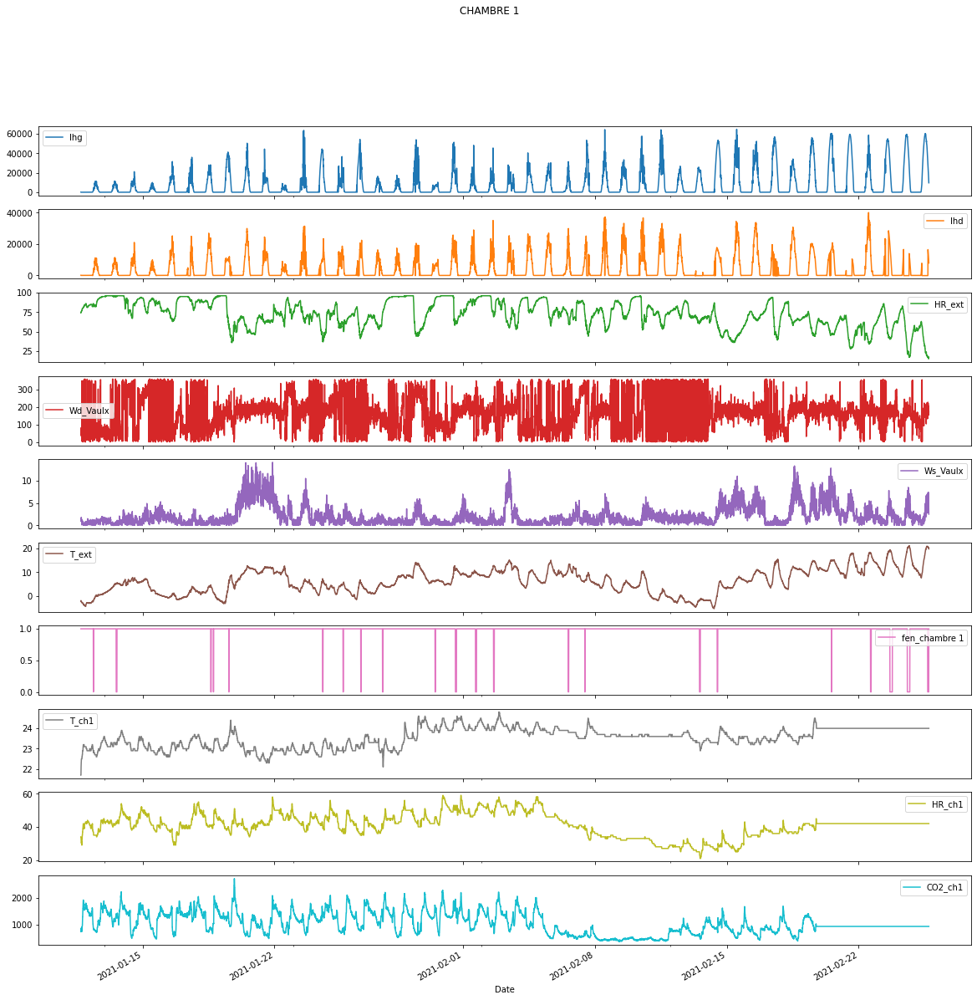

In [10]:
df1.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 1')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

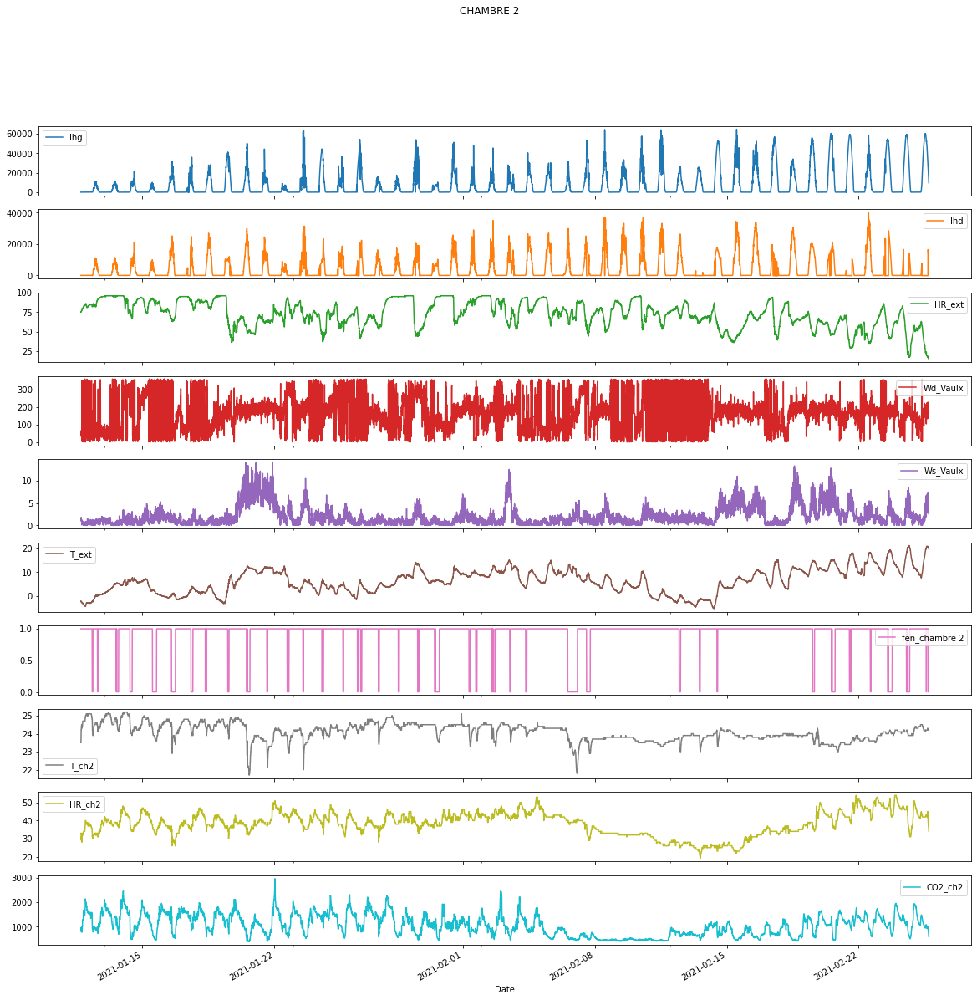

In [11]:
df2.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 2')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

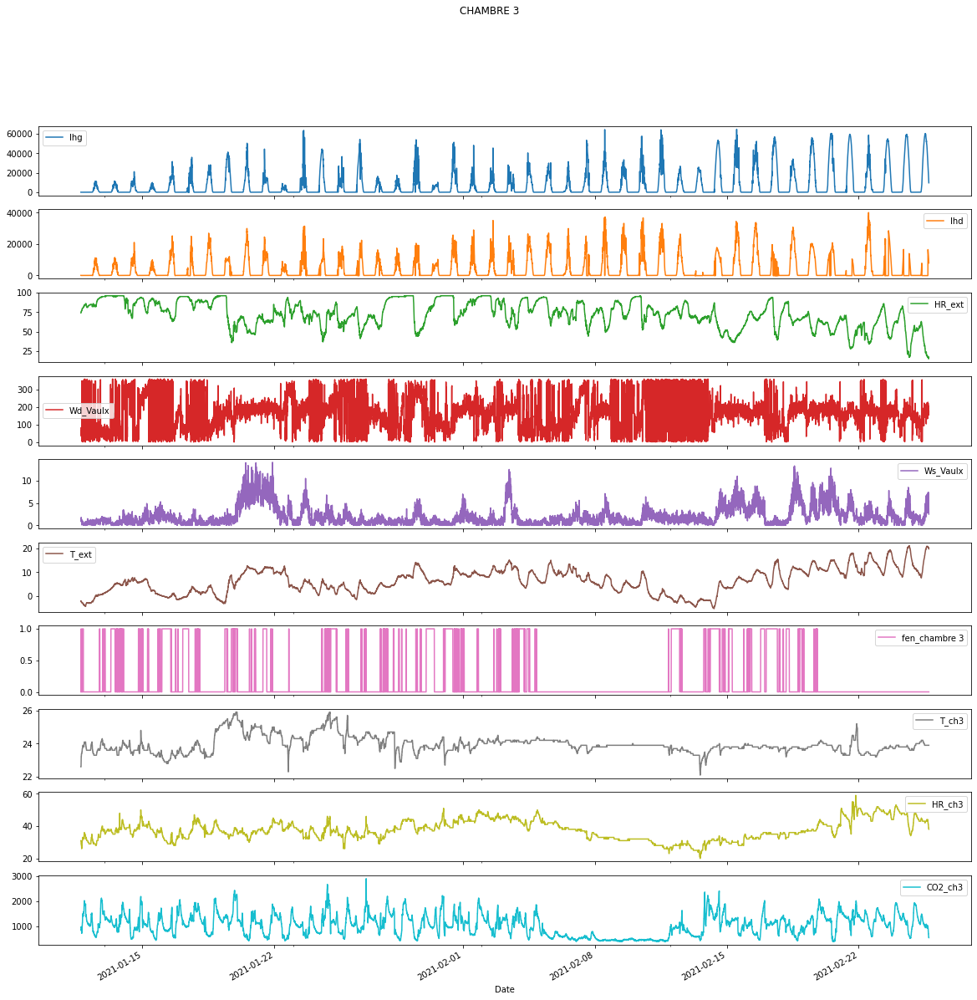

In [12]:
df3.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='CHAMBRE 3')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>], dtype=object)

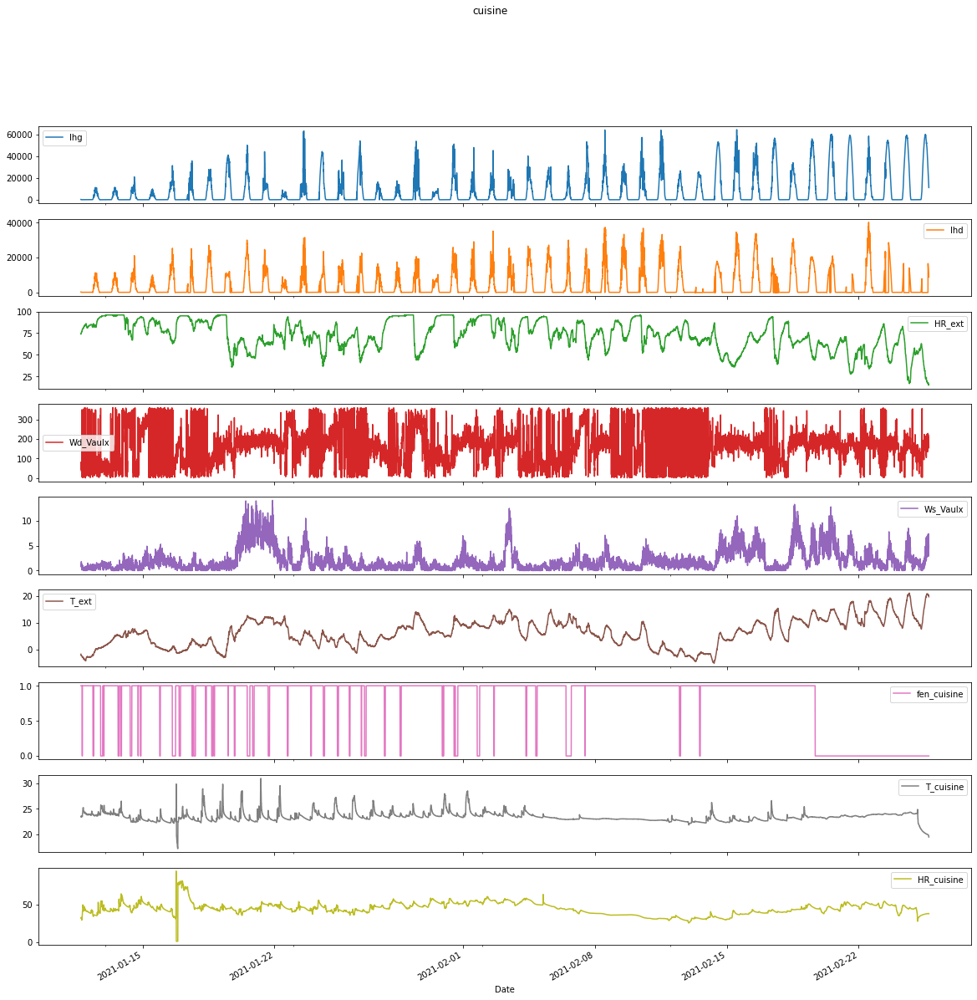

In [13]:
dfc.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='cuisine')

array([<AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>,
       <AxesSubplot:xlabel='Date'>, <AxesSubplot:xlabel='Date'>],
      dtype=object)

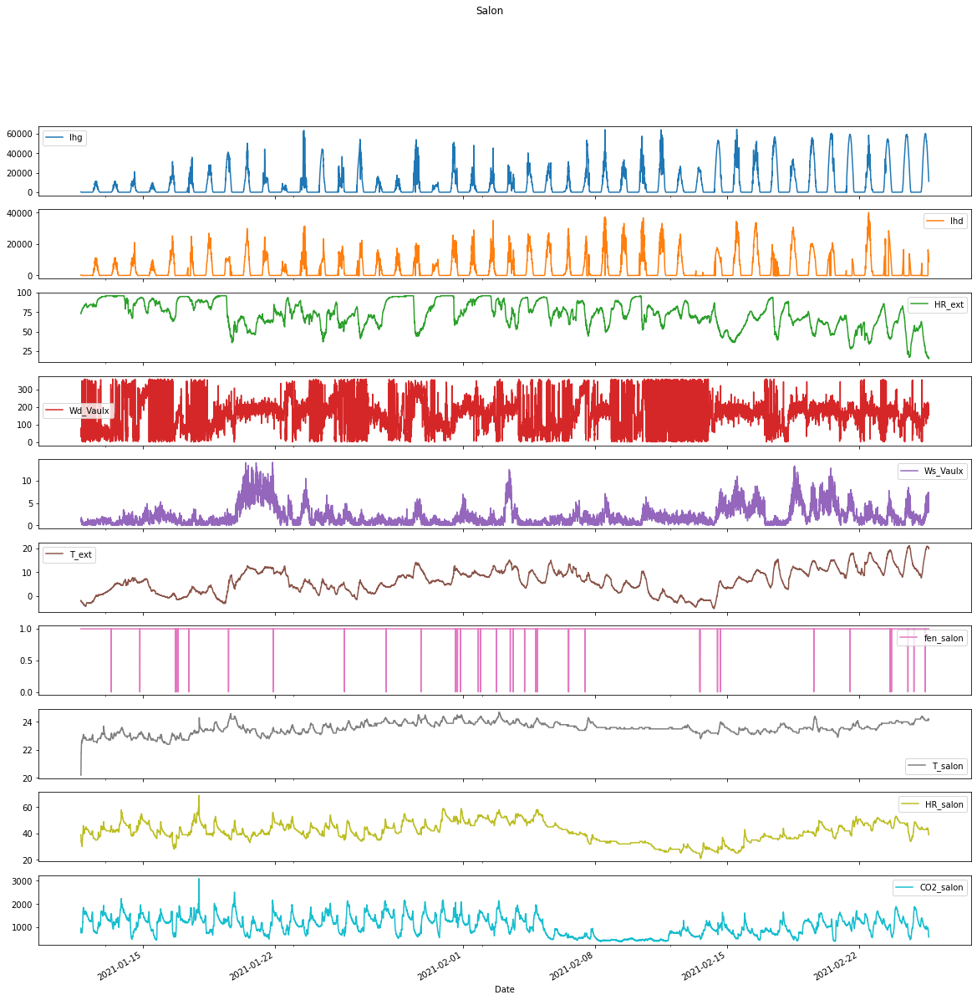

In [14]:
dfs.plot(x='Date',x_compat=True,subplots=True,figsize=(20,20),title='Salon')

(<AxesSubplot:title={'center':'ValloniereR4'}, ylabel='fen_chambre 1'>,
 1    0.981557
 0    0.018443
 Name: fen_chambre 1, dtype: float64)

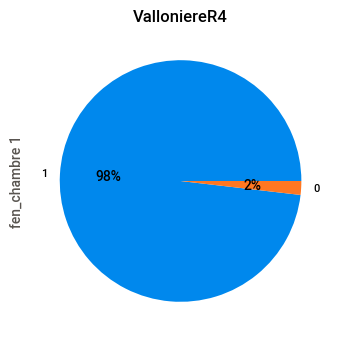

In [51]:
df1['fen_chambre 1'].value_counts().plot.pie(autopct='%1.0f%%',title='ValloniereR4'),df1['fen_chambre 1'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'ValloniereR4'}, ylabel='fen_chambre 2'>,
 1    0.910936
 0    0.089064
 Name: fen_chambre 2, dtype: float64)

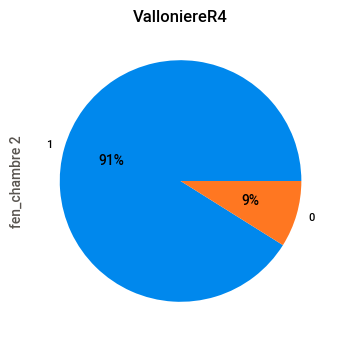

In [52]:
df2['fen_chambre 2'].value_counts().plot.pie(autopct='%1.0f%%',title='ValloniereR4'),df2['fen_chambre 2'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'ValloniereR4'}, ylabel='fen_chambre 3'>,
 0    0.825436
 1    0.174564
 Name: fen_chambre 3, dtype: float64)

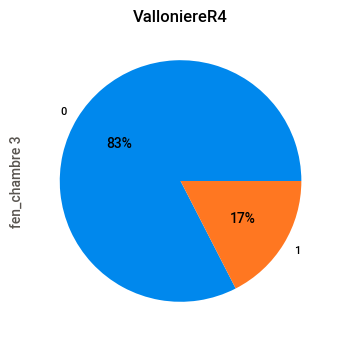

In [53]:
df3['fen_chambre 3'].value_counts().plot.pie(autopct='%1.0f%%',title='ValloniereR4'),df3['fen_chambre 3'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'ValloniereR4'}, ylabel='fen_cuisine'>,
 1    0.807856
 0    0.192144
 Name: fen_cuisine, dtype: float64)

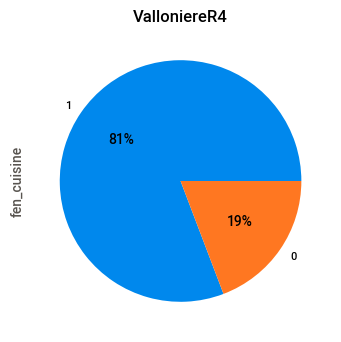

In [54]:
dfc['fen_cuisine'].value_counts().plot.pie(autopct='%1.0f%%',title='ValloniereR4'),dfc['fen_cuisine'].value_counts(normalize=True)

(<AxesSubplot:title={'center':'ValloniereR4'}, ylabel='fen_salon'>,
 1    0.994367
 0    0.005633
 Name: fen_salon, dtype: float64)

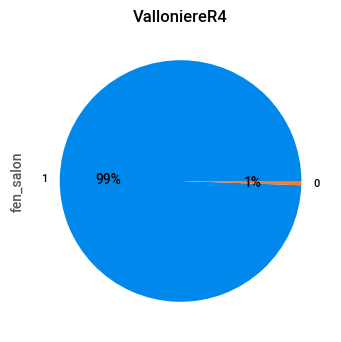

In [55]:
dfs['fen_salon'].value_counts().plot.pie(autopct='%1.0f%%',title='ValloniereR4'),dfs['fen_salon'].value_counts(normalize=True)

In [20]:
f1_df = df1[df1['fen_chambre 1']==1]
f2_df = df2[df2['fen_chambre 2']==1]
f3_df = df3[df3['fen_chambre 3']==1]
fc_df = dfc[dfc['fen_cuisine']==1]
fs_df = dfs[dfs['fen_salon']==1]

In [21]:
o1_df = df1[df1['fen_chambre 1']==0]
o2_df = df2[df2['fen_chambre 2']==0]
o3_df = df3[df3['fen_chambre 3']==0]
oc_df = dfc[dfc['fen_cuisine']==0]
os_df = dfs[dfs['fen_salon']==0]

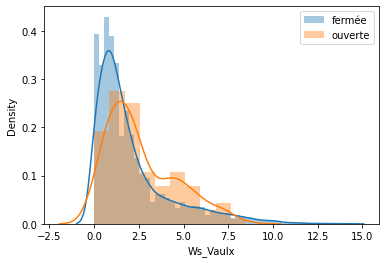

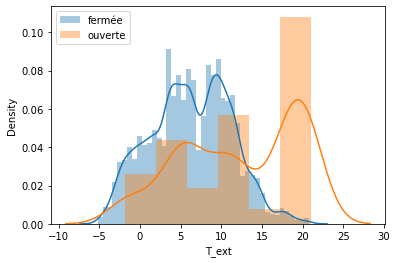

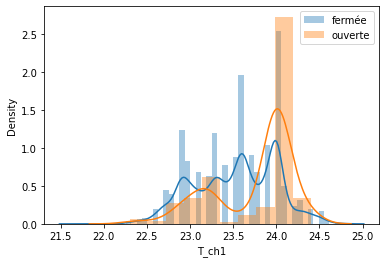

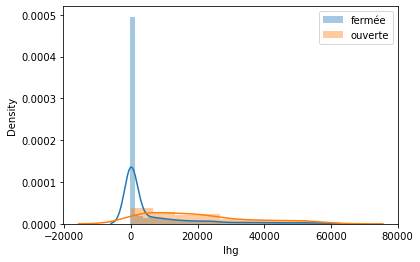

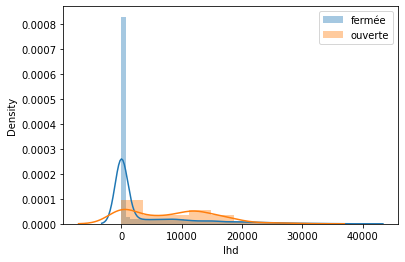

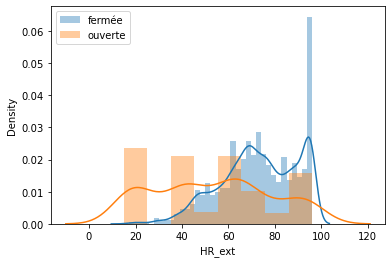

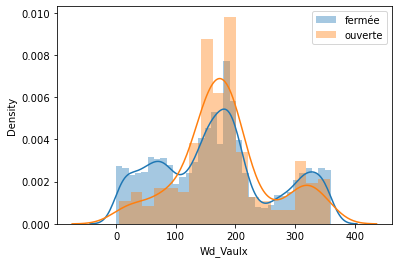

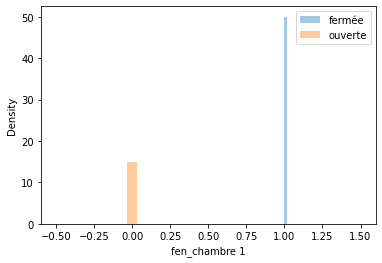

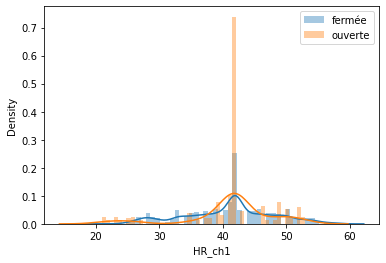

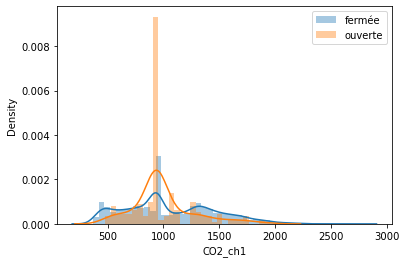

In [22]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.distplot(f1_df[col],label='fermée')
    sns.distplot(o1_df[col],label='ouverte')
    plt.legend()

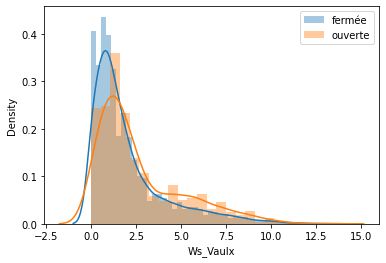

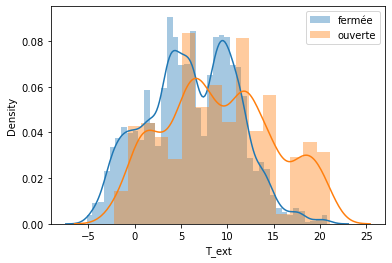

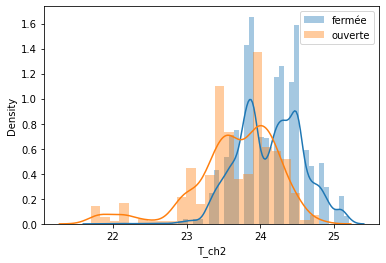

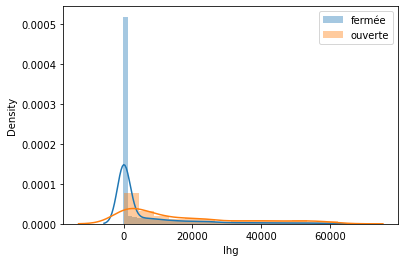

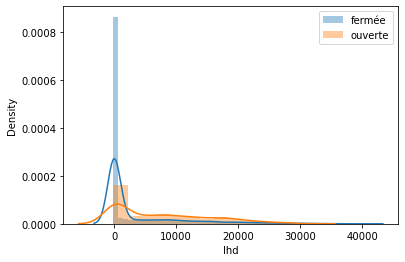

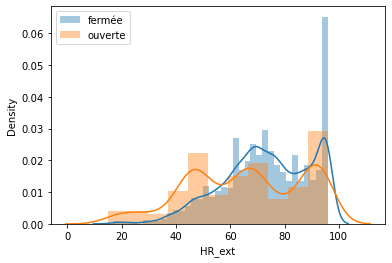

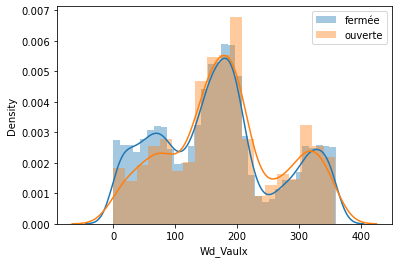

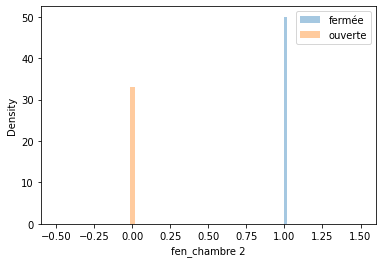

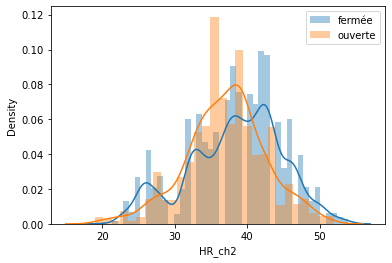

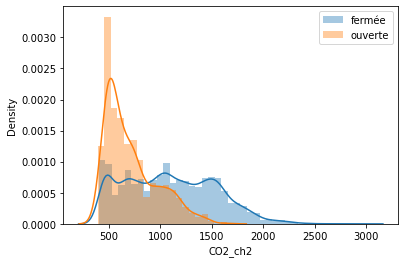

In [23]:
#chambre 2 
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.distplot(f2_df[col],label='fermée')
    sns.distplot(o2_df[col],label='ouverte')
    plt.legend()

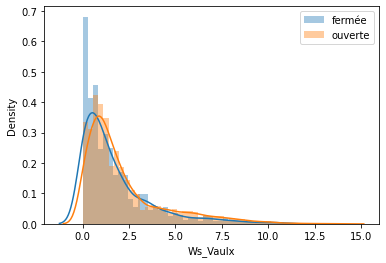

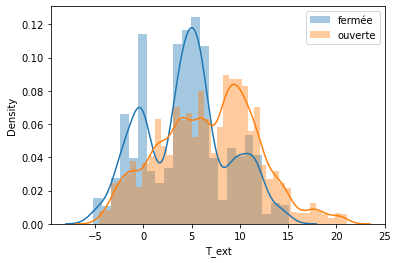

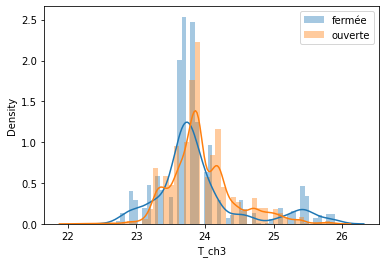

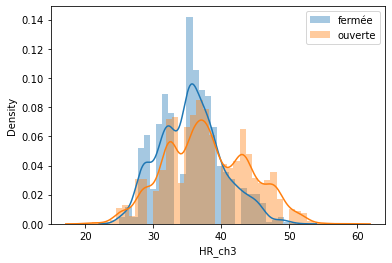

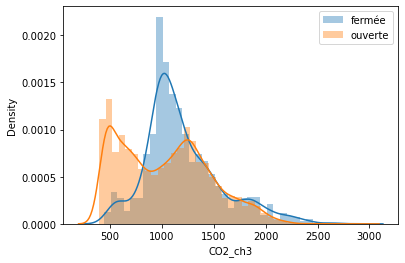

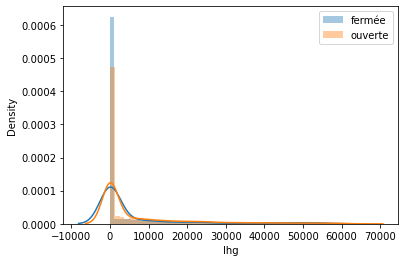

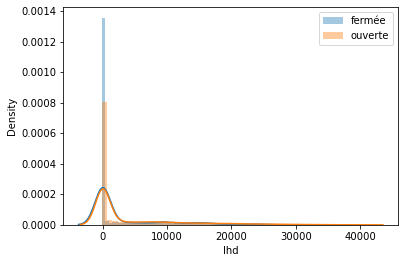

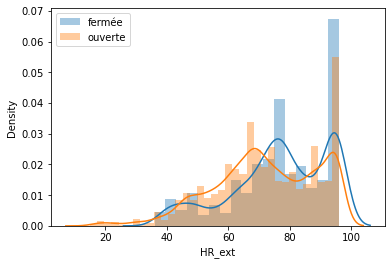

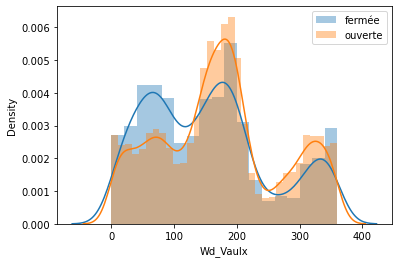

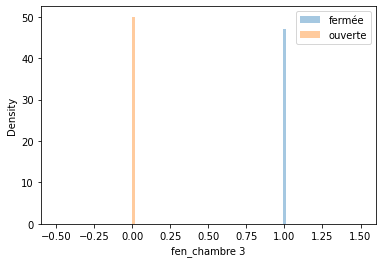

In [24]:
for col in df3.select_dtypes('float'):
    plt.figure()
    sns.distplot(f3_df[col],label='fermée')
    sns.distplot(o3_df[col],label='ouverte')
    plt.legend()
for col in df3.select_dtypes('int'):
    plt.figure()
    sns.distplot(f3_df[col],label='fermée')
    sns.distplot(o3_df[col],label='ouverte')
    plt.legend()

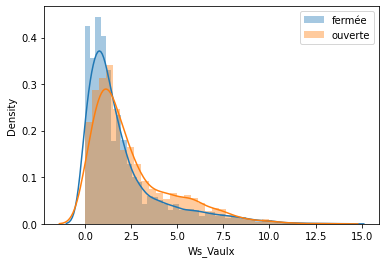

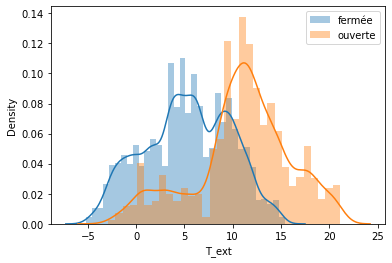

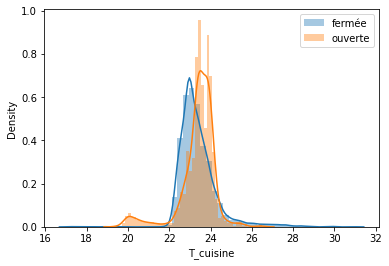

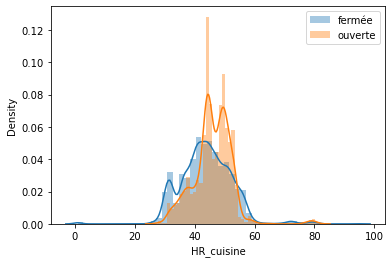

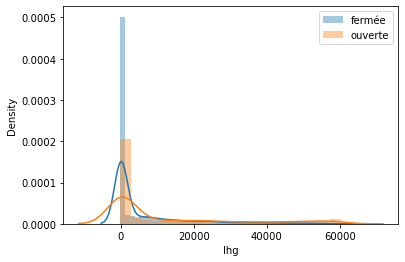

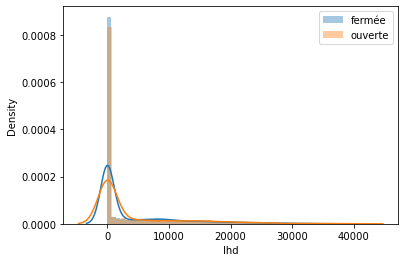

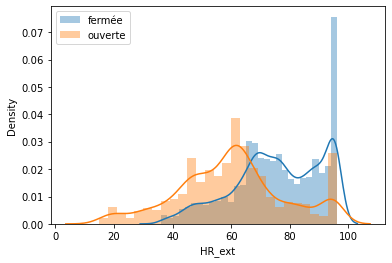

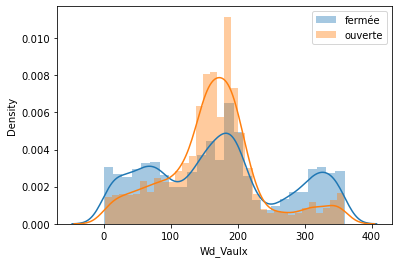

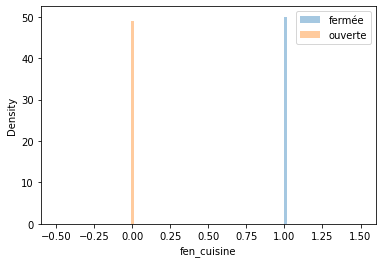

In [25]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.distplot(fc_df[col],label='fermée')
    sns.distplot(oc_df[col],label='ouverte')
    plt.legend()

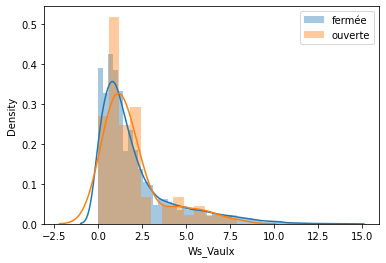

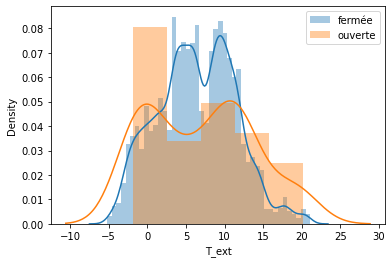

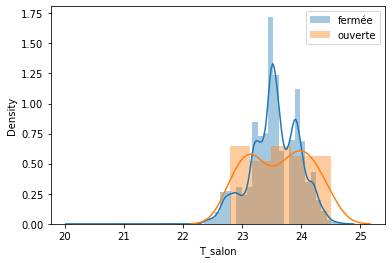

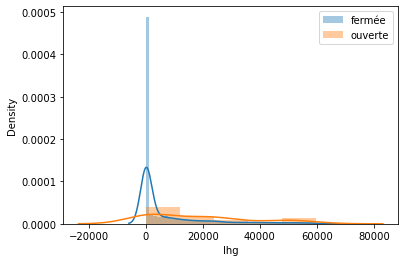

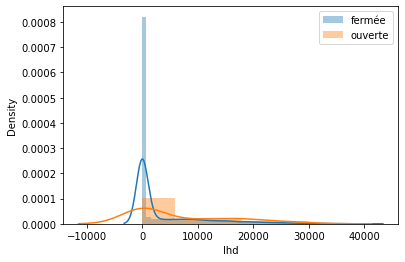

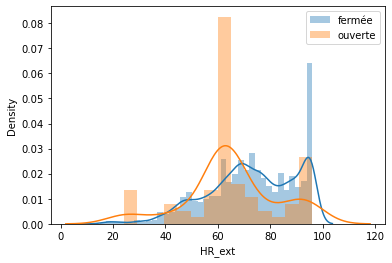

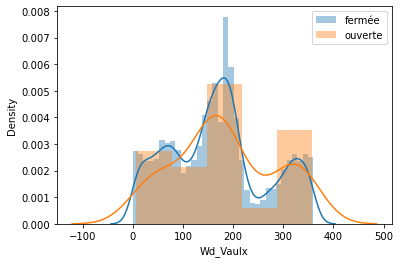

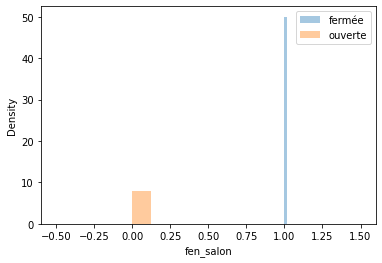

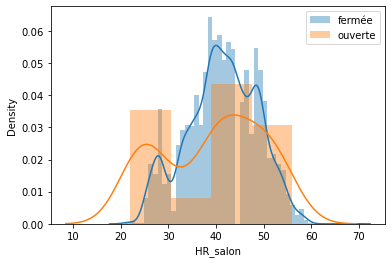

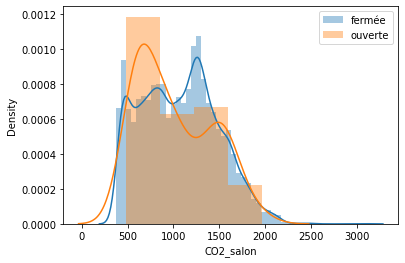

In [26]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.distplot(fs_df[col],label='fermée')
    sns.distplot(os_df[col],label='ouverte')
    plt.legend()

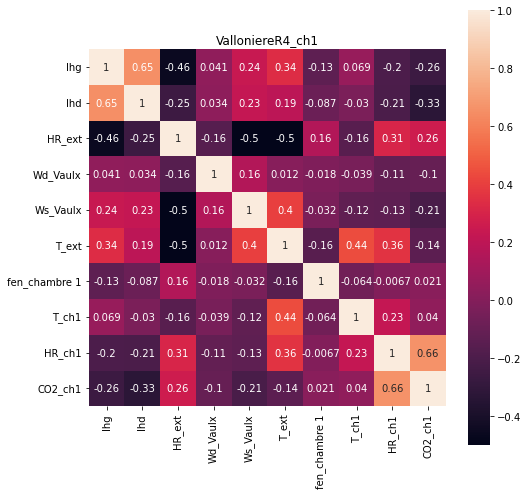

In [31]:
plt.subplots(figsize=(8,8))
sns.heatmap(df1.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('ValloniereR4_ch1')
plt.show()

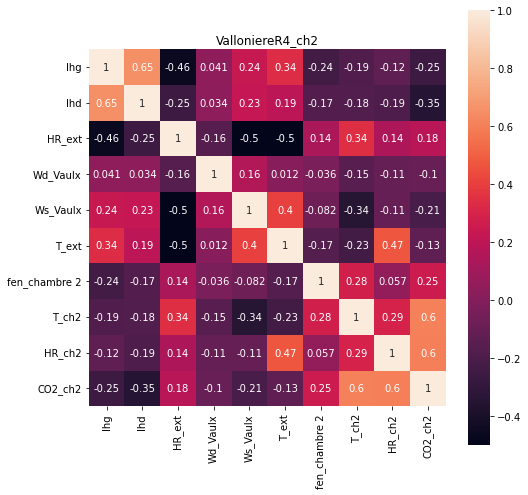

In [32]:
plt.subplots(figsize=(8,8))
sns.heatmap(df2.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('ValloniereR4_ch2')
plt.show()

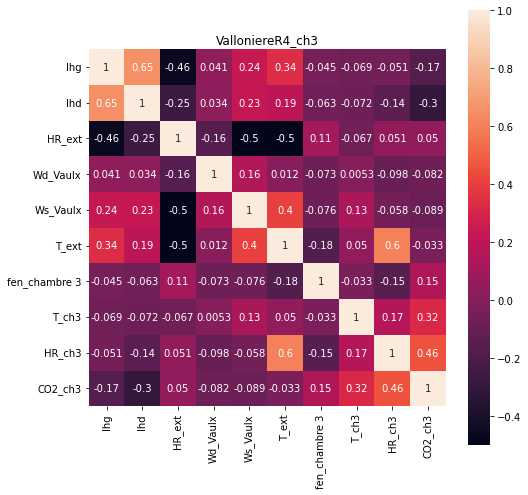

In [33]:
plt.subplots(figsize=(8,8))
sns.heatmap(df3.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('ValloniereR4_ch3')
plt.show()

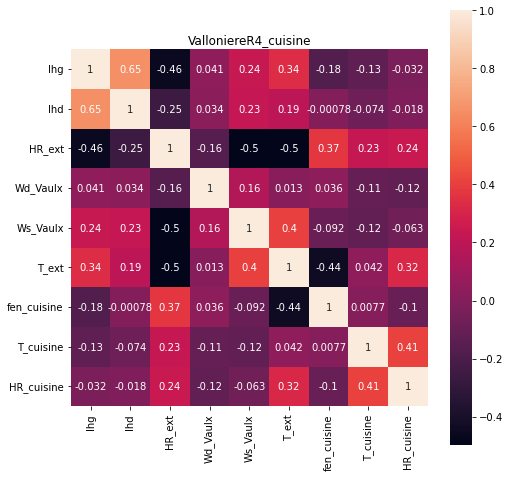

In [34]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfc.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('ValloniereR4_cuisine')
plt.show()

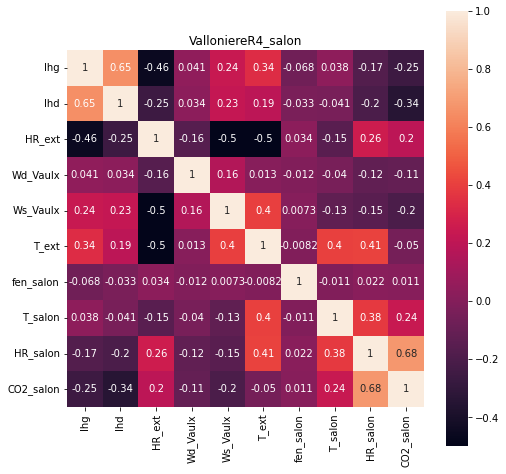

In [35]:
plt.subplots(figsize=(8,8))
sns.heatmap(dfs.corr(), annot=True, square=True, cbar=True)#center=0
plt.title('ValloniereR4_salon')
plt.show()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

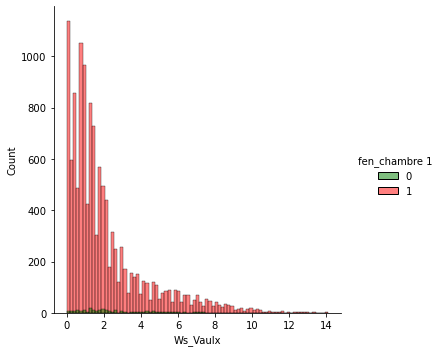

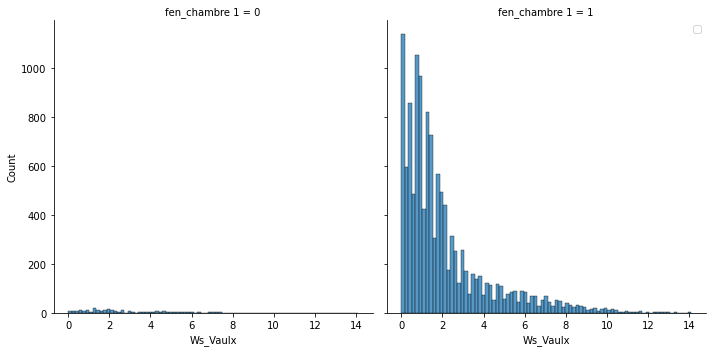

<Figure size 432x288 with 0 Axes>

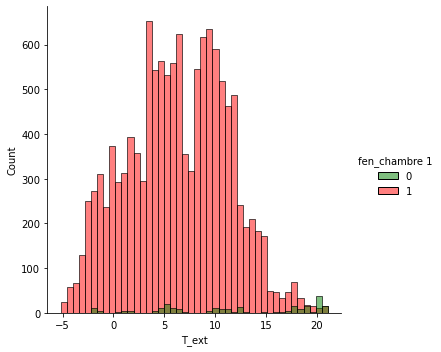

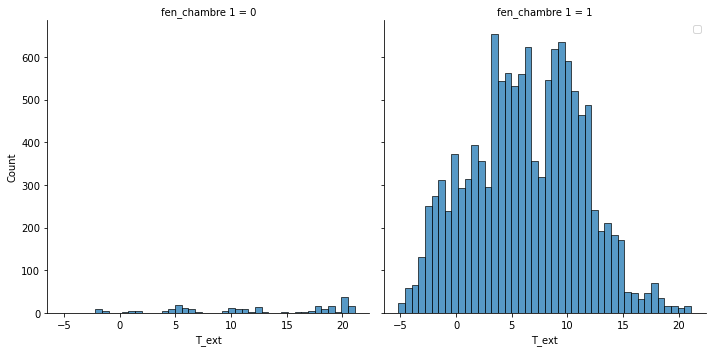

<Figure size 432x288 with 0 Axes>

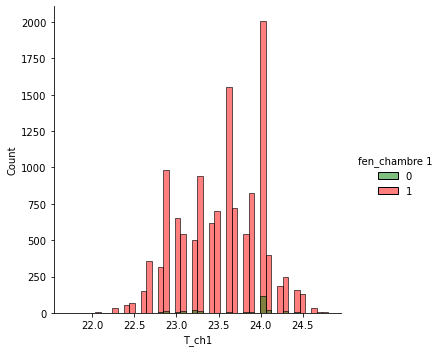

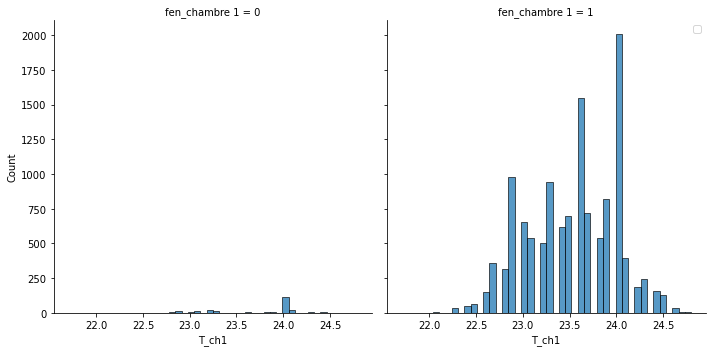

<Figure size 432x288 with 0 Axes>

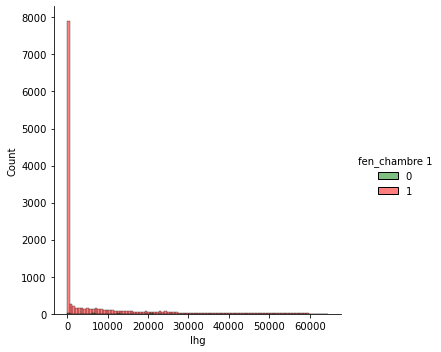

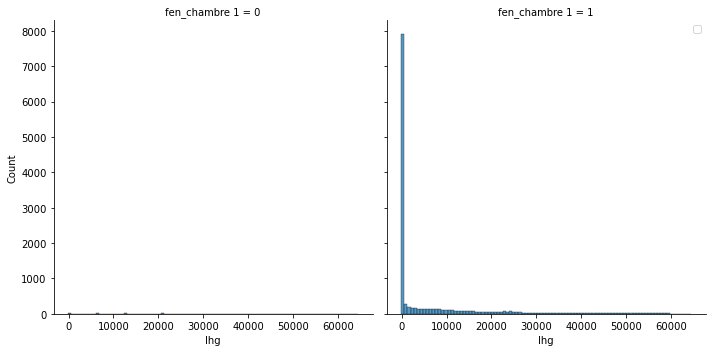

<Figure size 432x288 with 0 Axes>

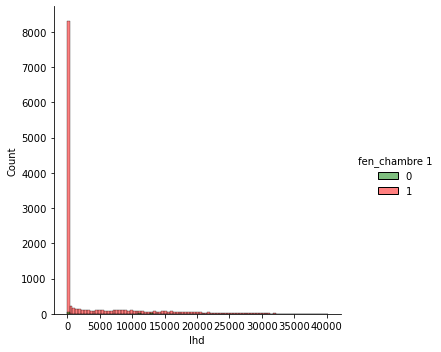

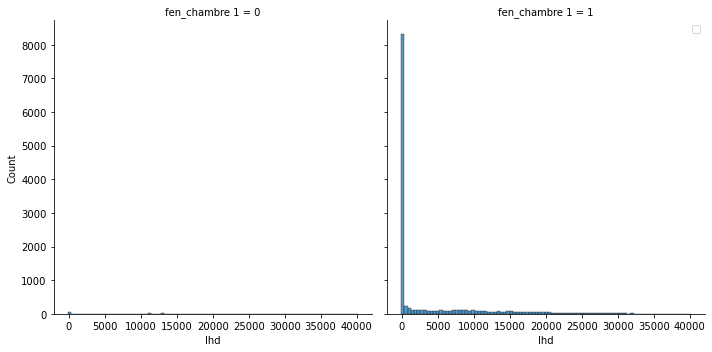

<Figure size 432x288 with 0 Axes>

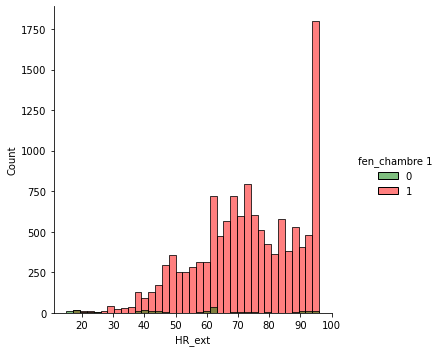

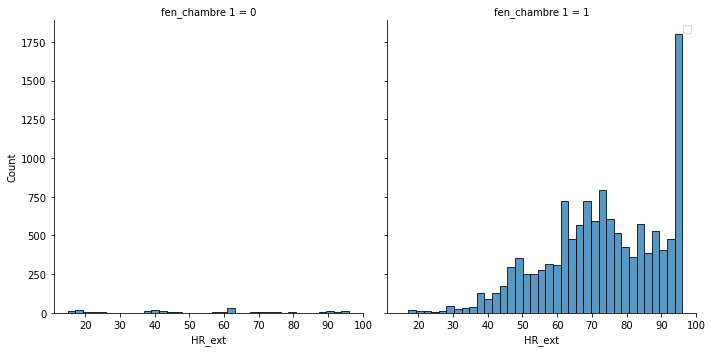

<Figure size 432x288 with 0 Axes>

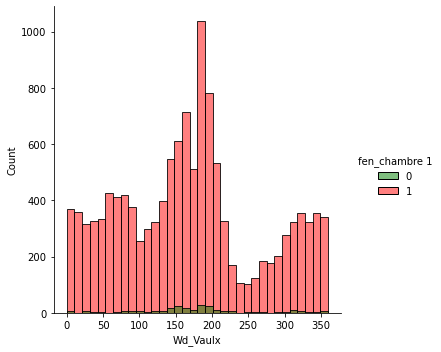

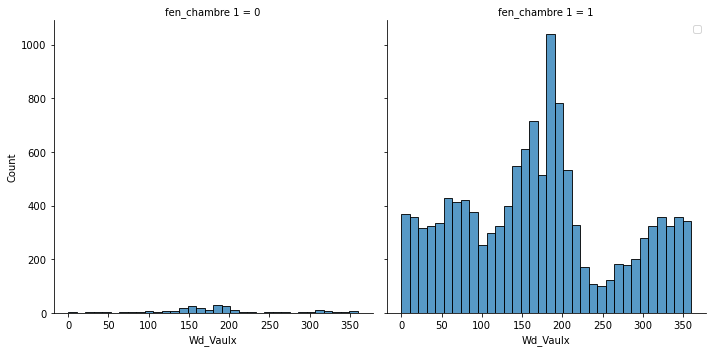

<Figure size 432x288 with 0 Axes>

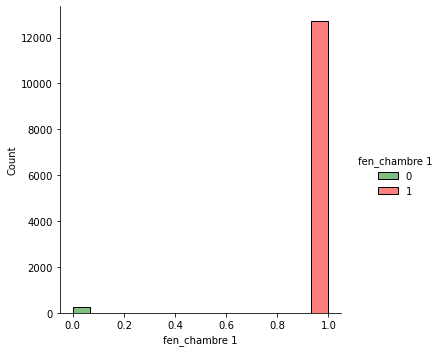

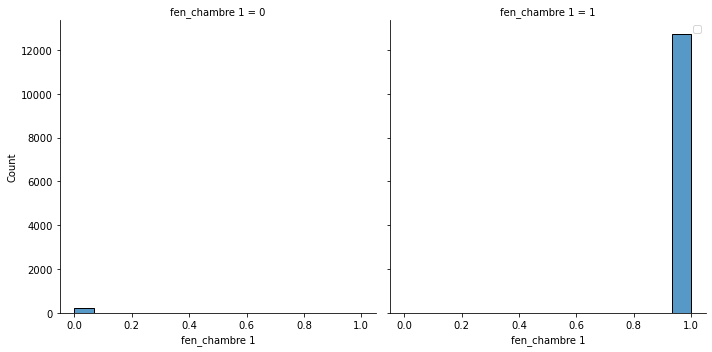

<Figure size 432x288 with 0 Axes>

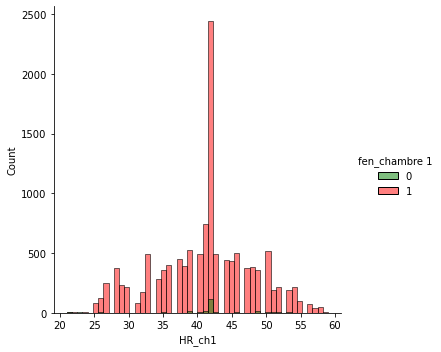

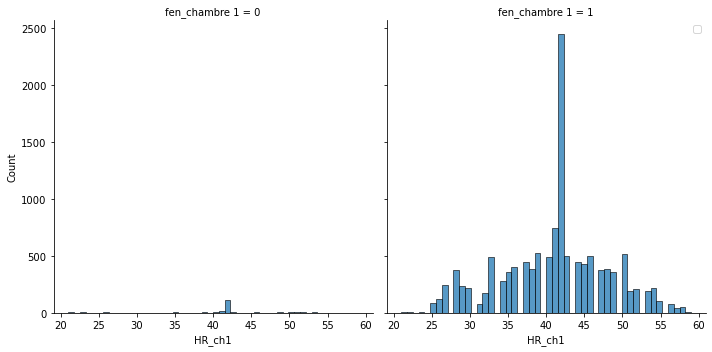

<Figure size 432x288 with 0 Axes>

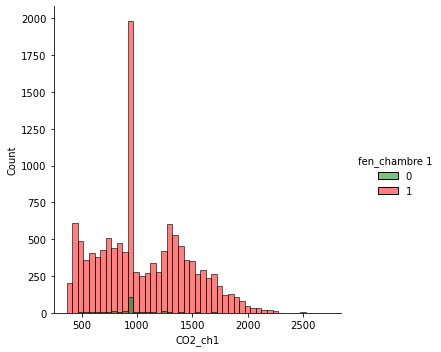

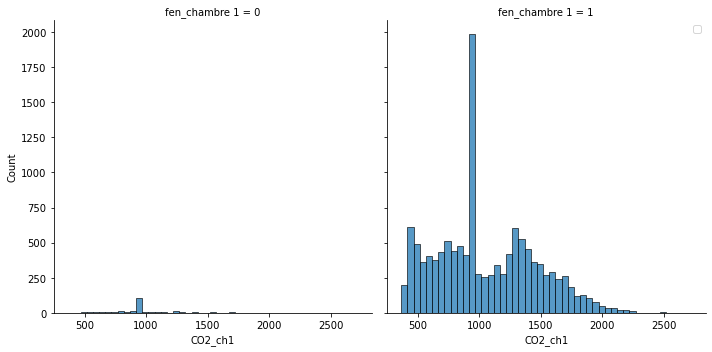

In [36]:
for col in df1.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_chambre 1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_chambre 1",palette=["g","r"])
    plt.legend()
for col in df1.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df1,x=col,hue="fen_chambre 1",palette=["g","r"])
    sns.displot(data=df1,x=col,col="fen_chambre 1",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

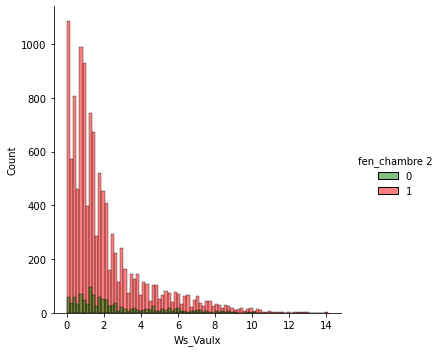

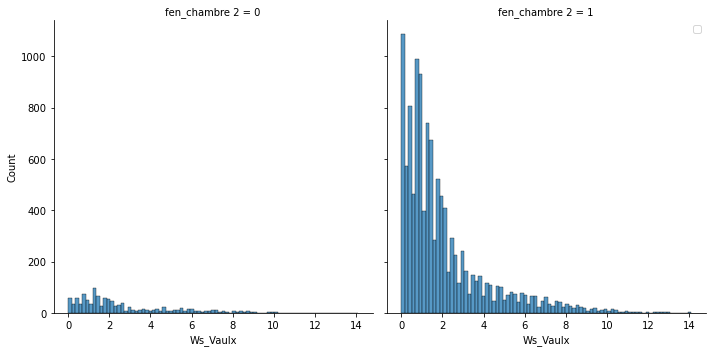

<Figure size 432x288 with 0 Axes>

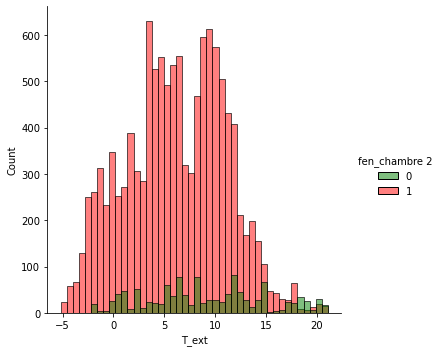

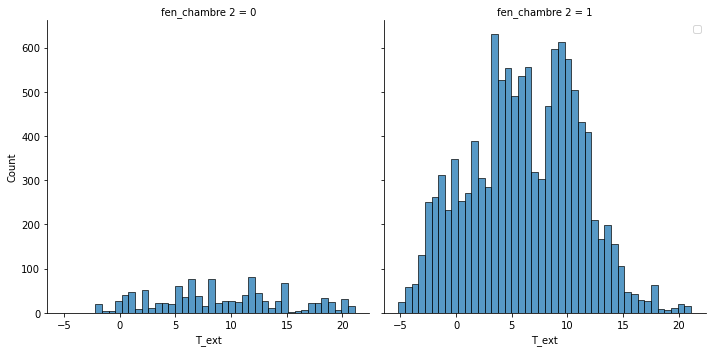

<Figure size 432x288 with 0 Axes>

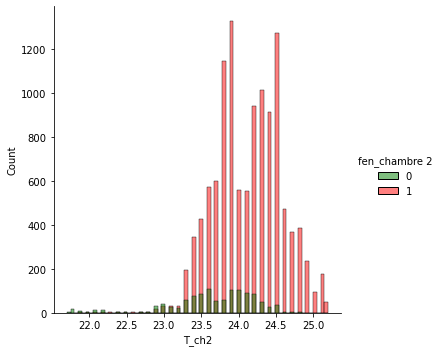

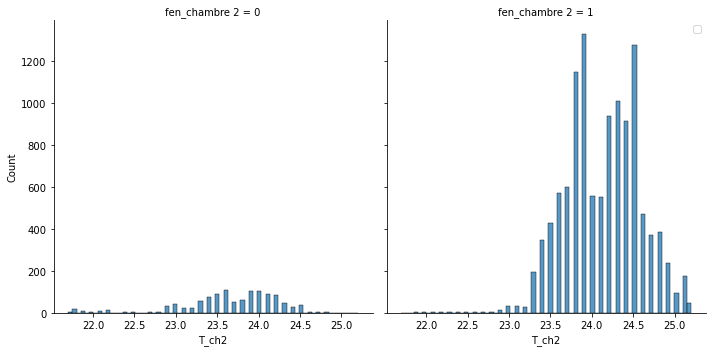

<Figure size 432x288 with 0 Axes>

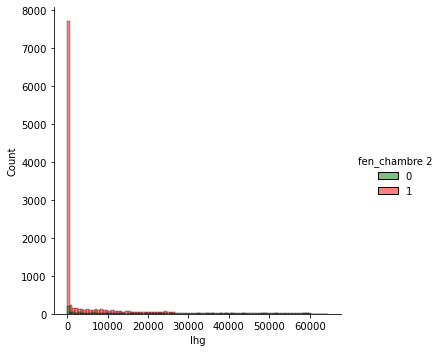

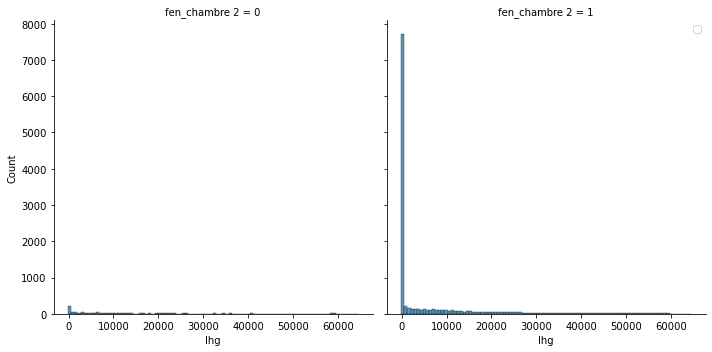

<Figure size 432x288 with 0 Axes>

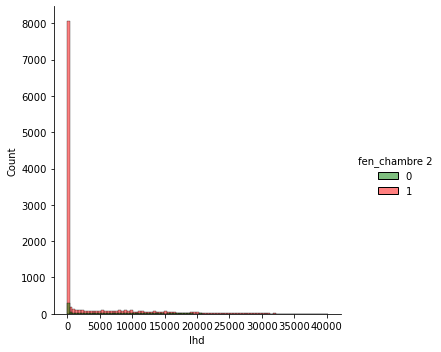

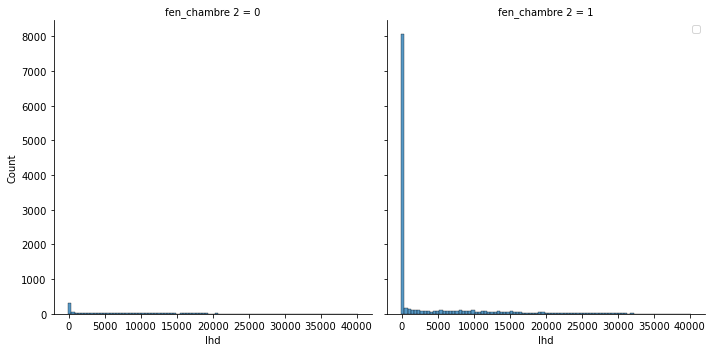

<Figure size 432x288 with 0 Axes>

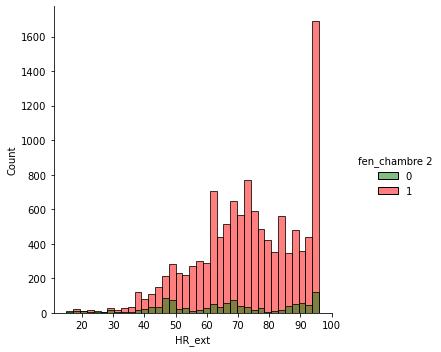

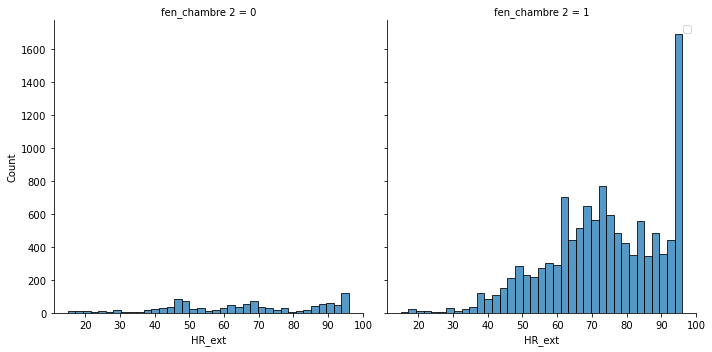

<Figure size 432x288 with 0 Axes>

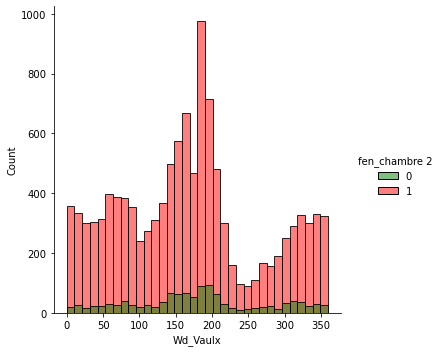

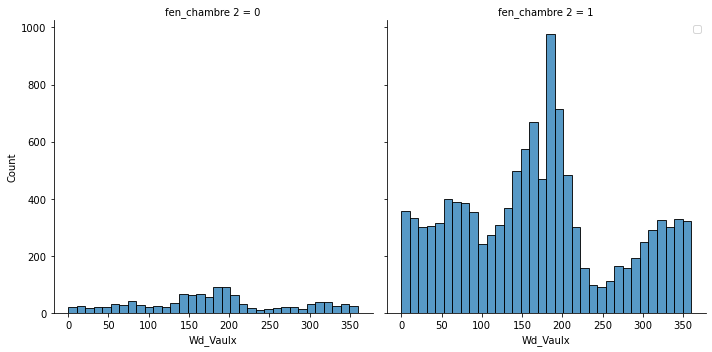

<Figure size 432x288 with 0 Axes>

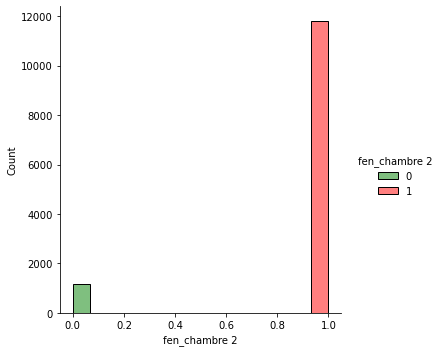

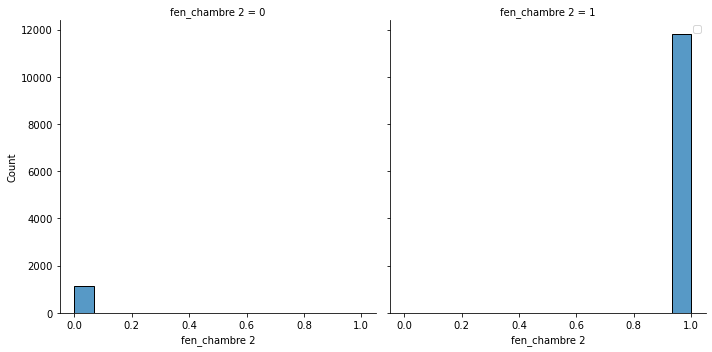

<Figure size 432x288 with 0 Axes>

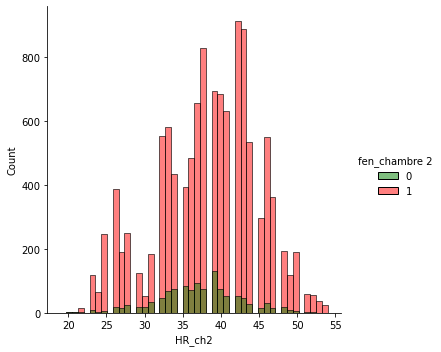

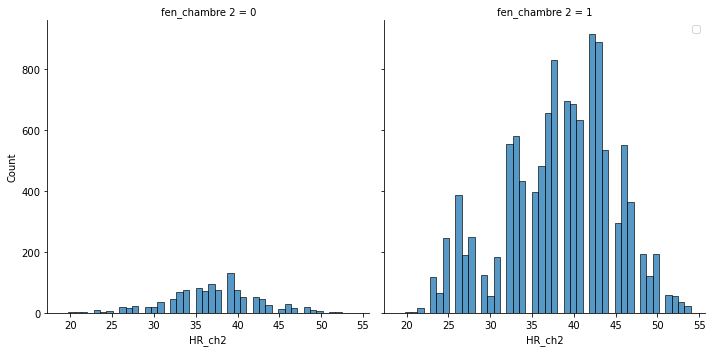

<Figure size 432x288 with 0 Axes>

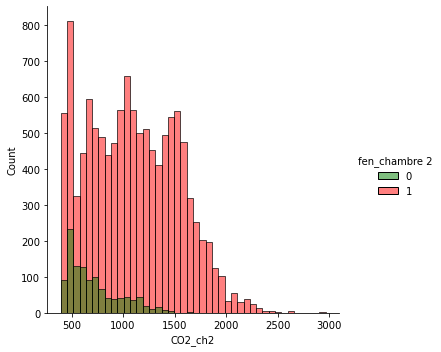

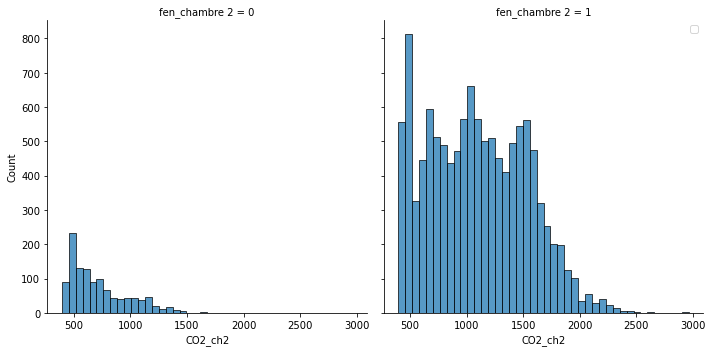

In [37]:
for col in df2.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_chambre 2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_chambre 2",palette=["g","r"])
    plt.legend()
for col in df2.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df2,x=col,hue="fen_chambre 2",palette=["g","r"])
    sns.displot(data=df2,x=col,col="fen_chambre 2",palette=["g","r"])
    plt.legend()    

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

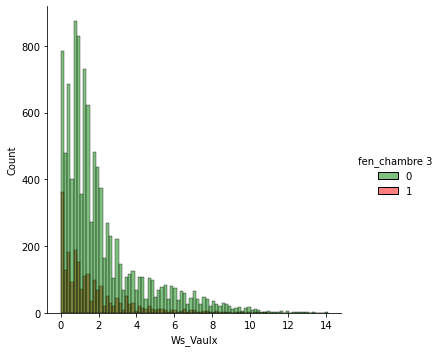

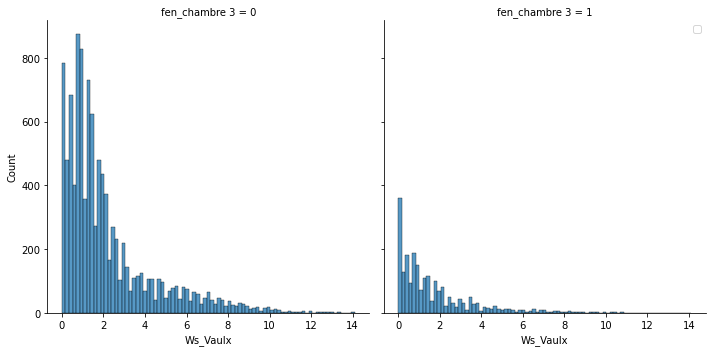

<Figure size 432x288 with 0 Axes>

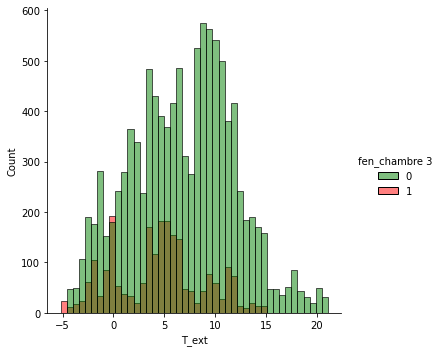

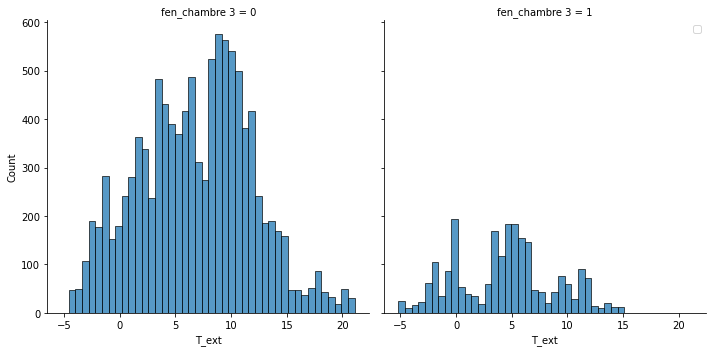

<Figure size 432x288 with 0 Axes>

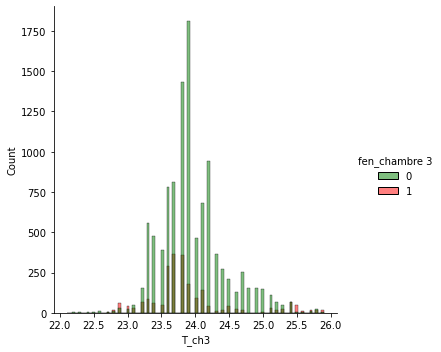

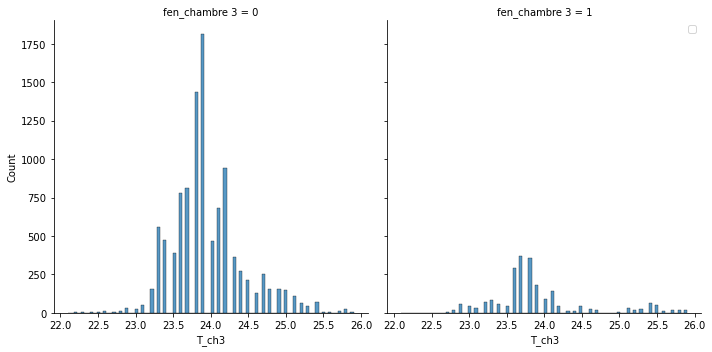

<Figure size 432x288 with 0 Axes>

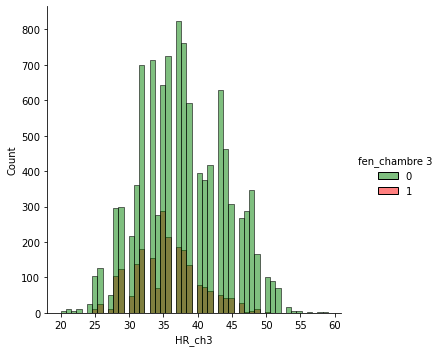

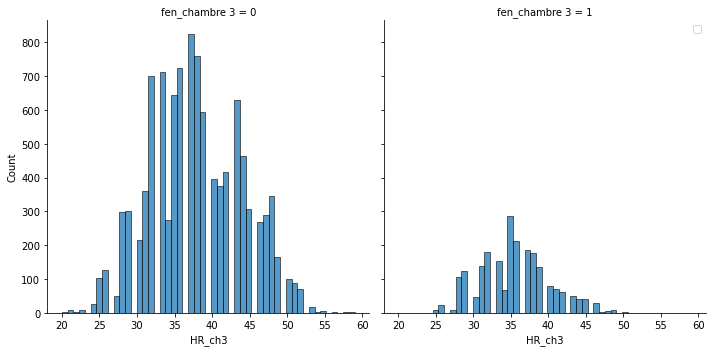

<Figure size 432x288 with 0 Axes>

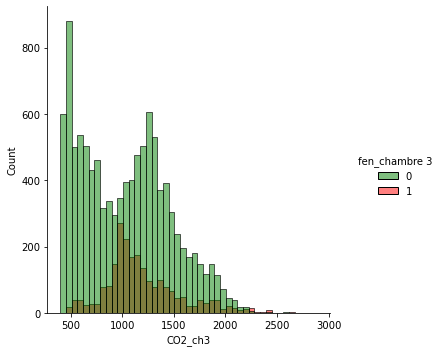

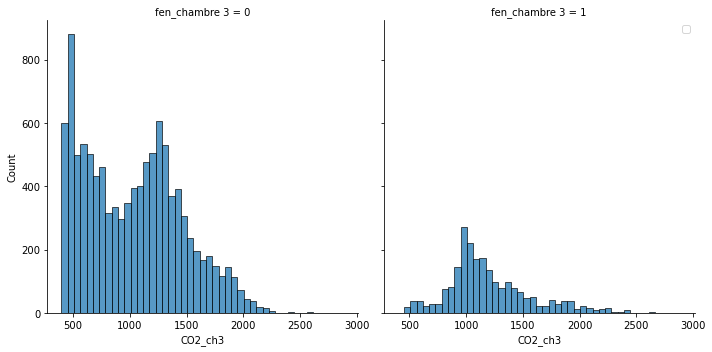

<Figure size 432x288 with 0 Axes>

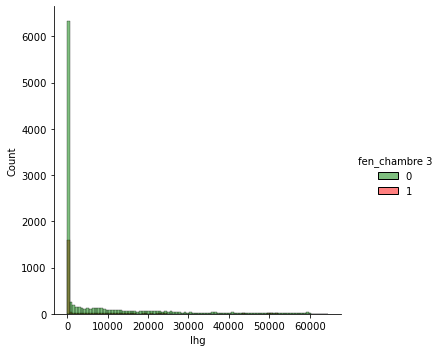

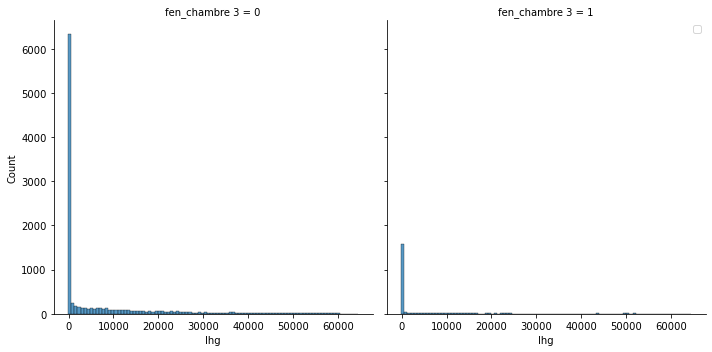

<Figure size 432x288 with 0 Axes>

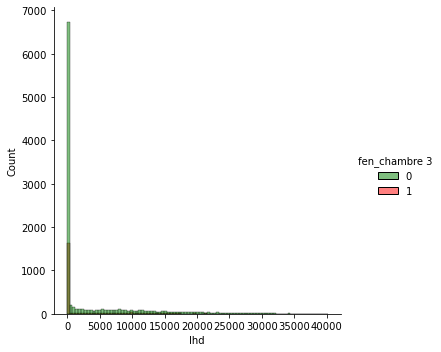

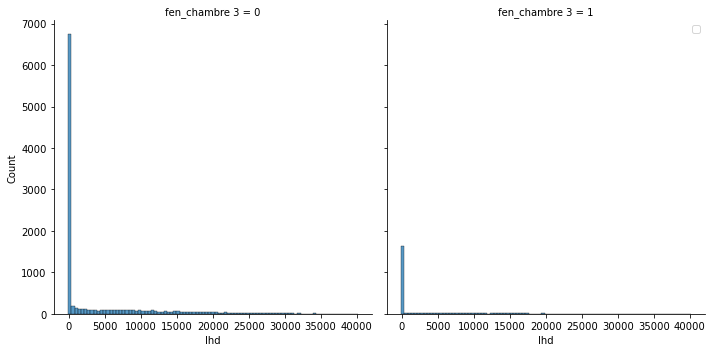

<Figure size 432x288 with 0 Axes>

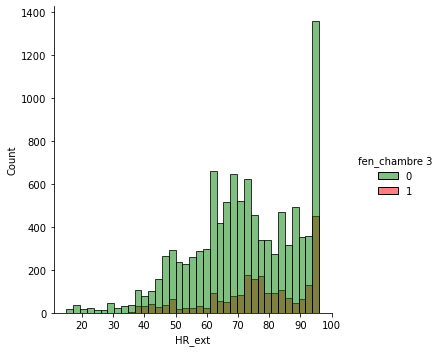

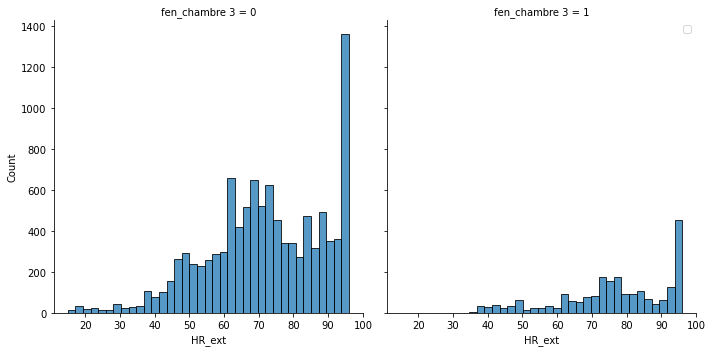

<Figure size 432x288 with 0 Axes>

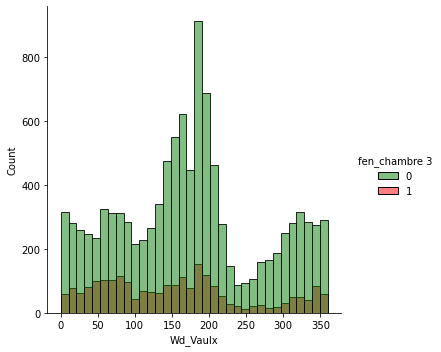

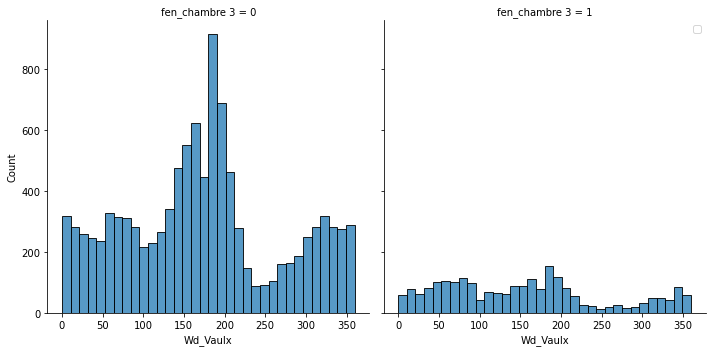

<Figure size 432x288 with 0 Axes>

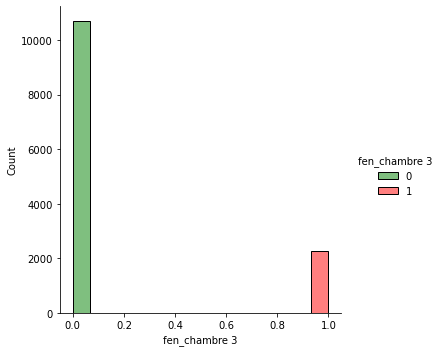

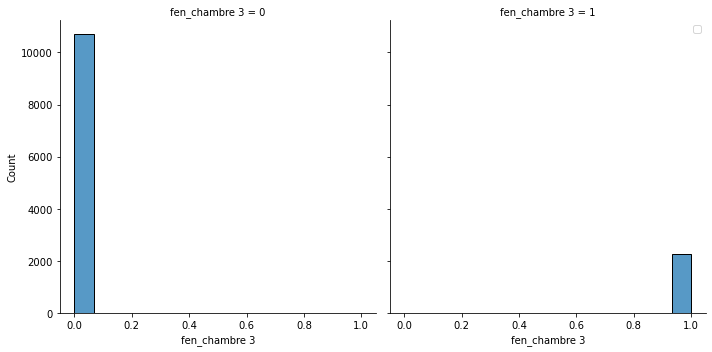

In [38]:
for col in df3.select_dtypes('float'):
    plt.figure()
    sns.displot(data=df3,x=col,hue="fen_chambre 3",palette=["g","r"])
    sns.displot(data=df3,x=col,col="fen_chambre 3",palette=["g","r"])
    plt.legend()
for col in df3.select_dtypes('int'):
    plt.figure()
    sns.displot(data=df3,x=col,hue="fen_chambre 3",palette=["g","r"])
    sns.displot(data=df3,x=col,col="fen_chambre 3",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

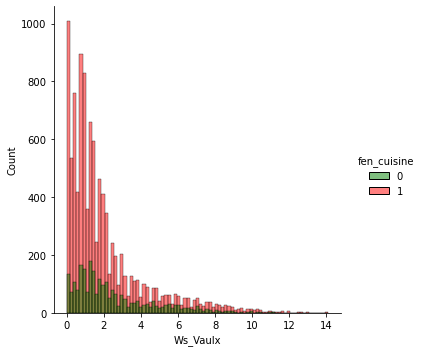

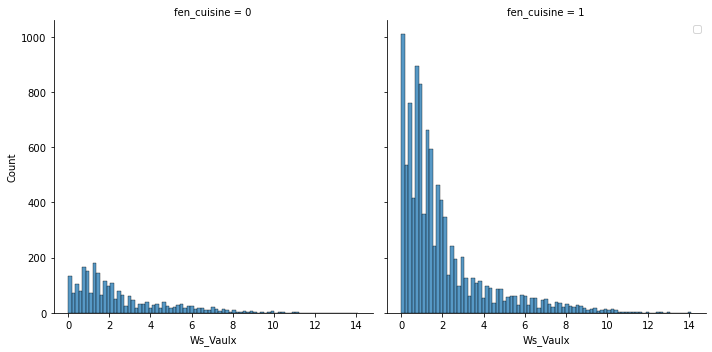

<Figure size 432x288 with 0 Axes>

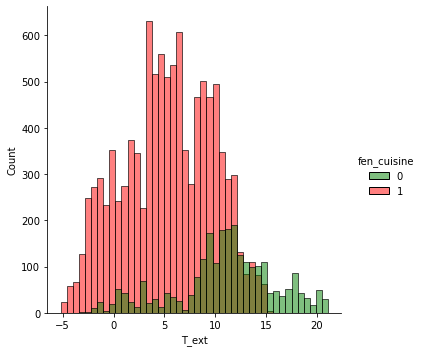

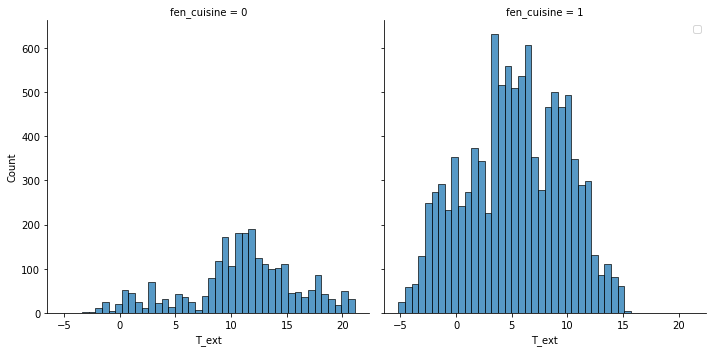

<Figure size 432x288 with 0 Axes>

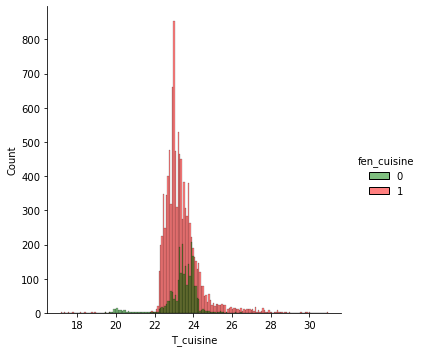

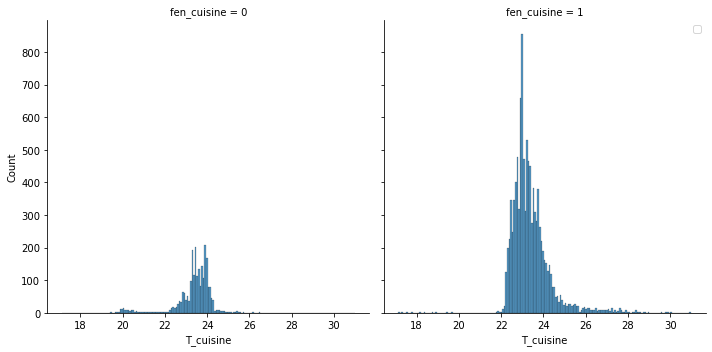

<Figure size 432x288 with 0 Axes>

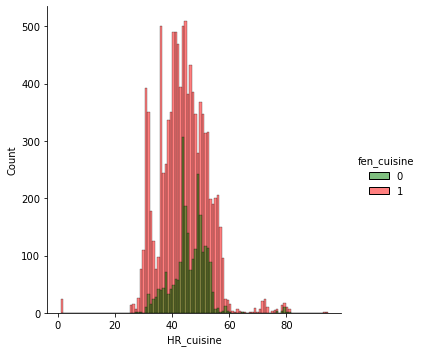

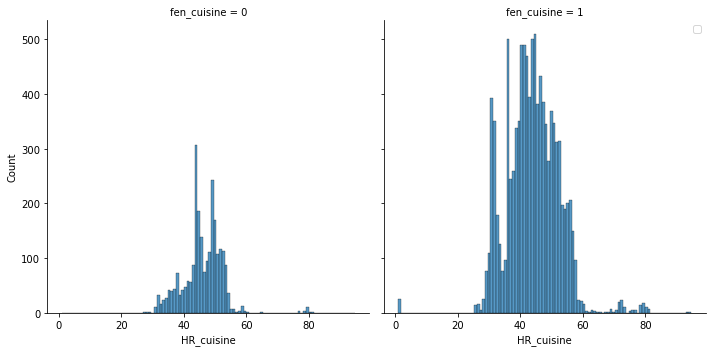

<Figure size 432x288 with 0 Axes>

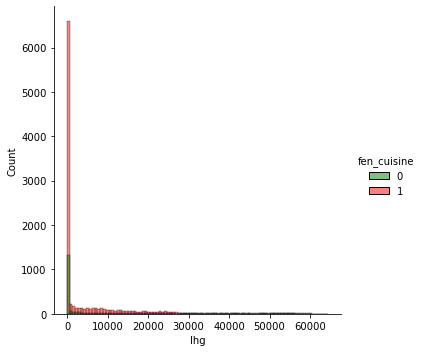

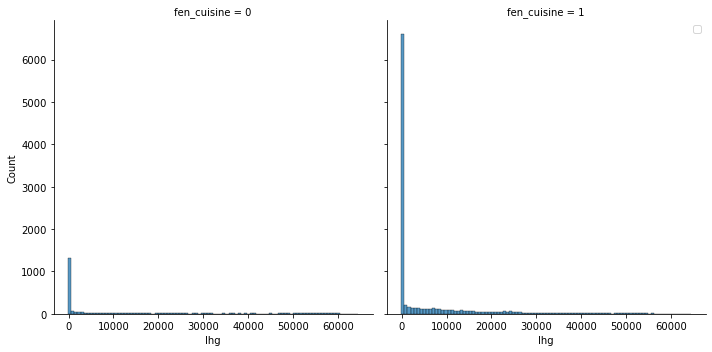

<Figure size 432x288 with 0 Axes>

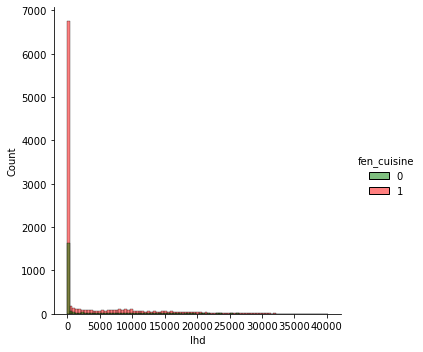

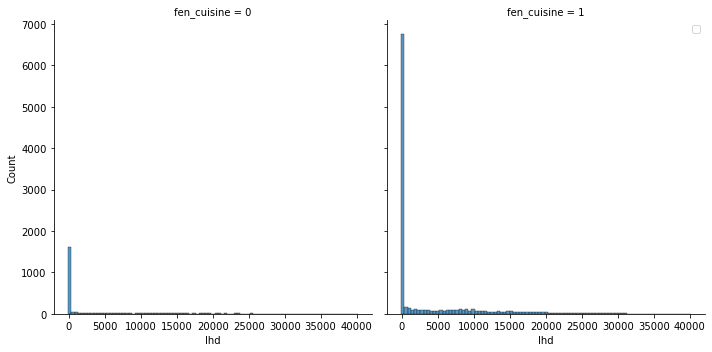

<Figure size 432x288 with 0 Axes>

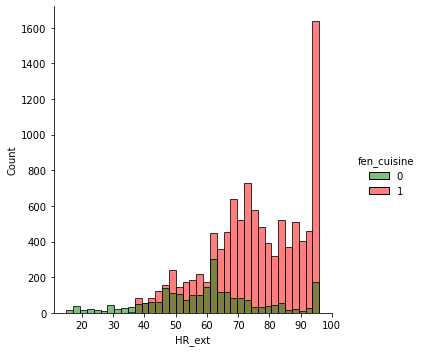

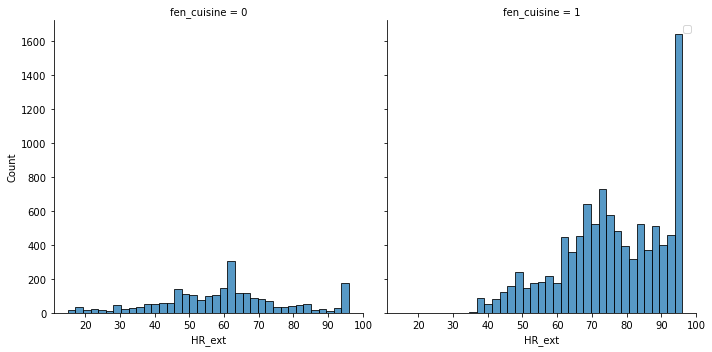

<Figure size 432x288 with 0 Axes>

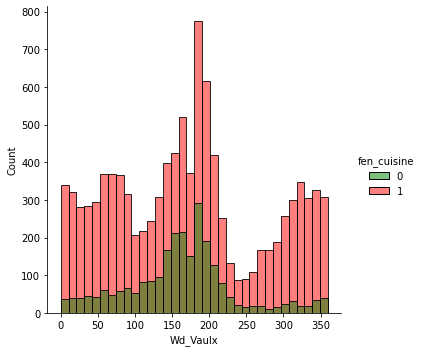

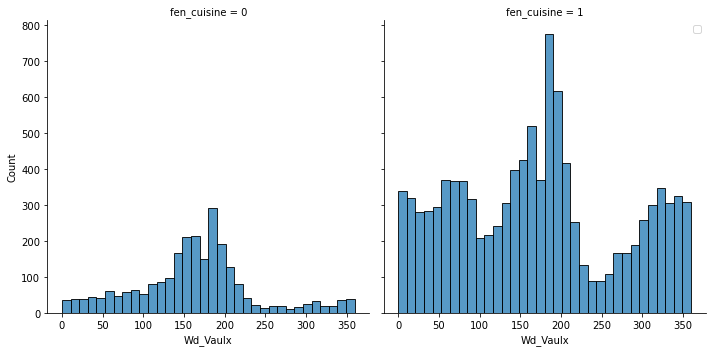

<Figure size 432x288 with 0 Axes>

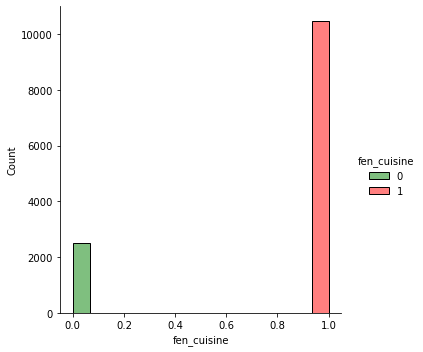

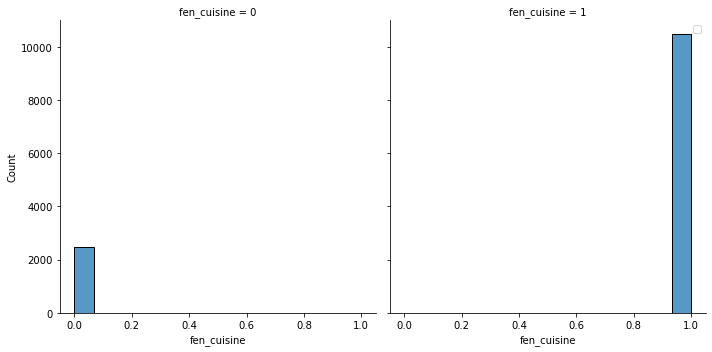

In [39]:
for col in dfc.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()
for col in dfc.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfc,x=col,hue="fen_cuisine",palette=["g","r"])
    sns.displot(data=dfc,x=col,col="fen_cuisine",palette=["g","r"])
    plt.legend()

No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.
No handles with labels found to put in legend.


<Figure size 432x288 with 0 Axes>

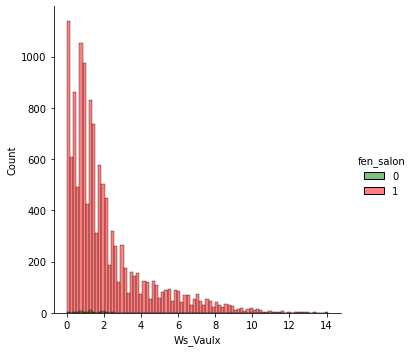

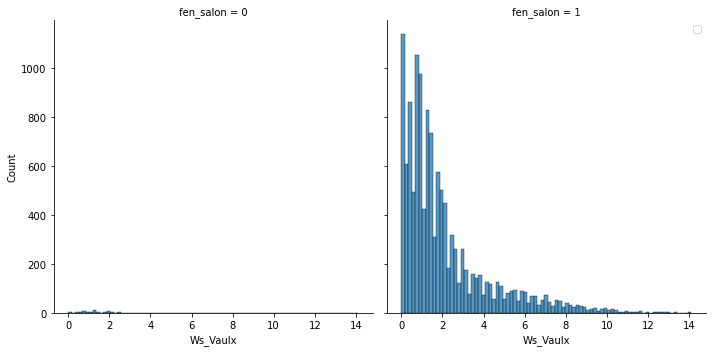

<Figure size 432x288 with 0 Axes>

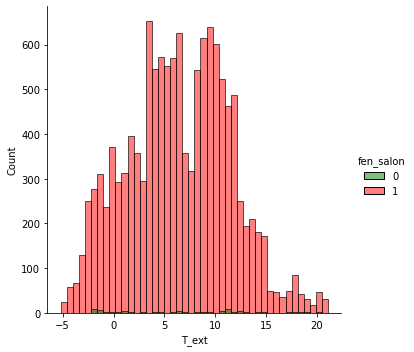

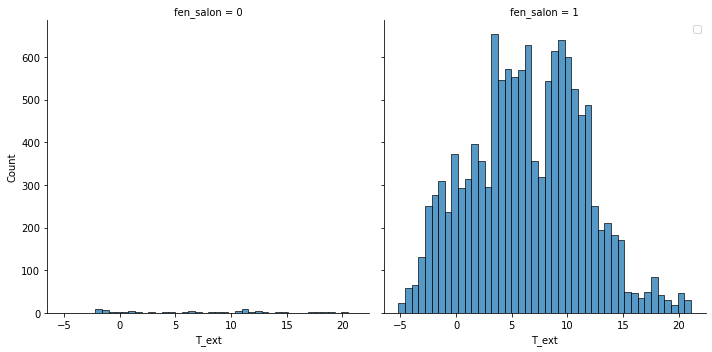

<Figure size 432x288 with 0 Axes>

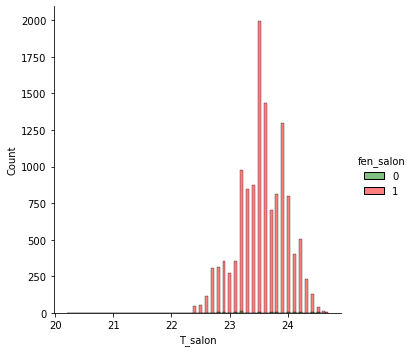

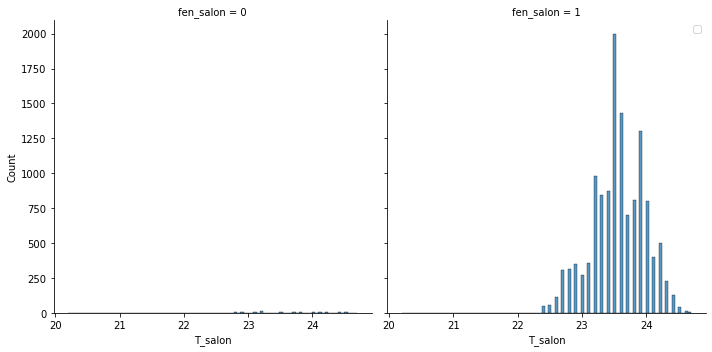

<Figure size 432x288 with 0 Axes>

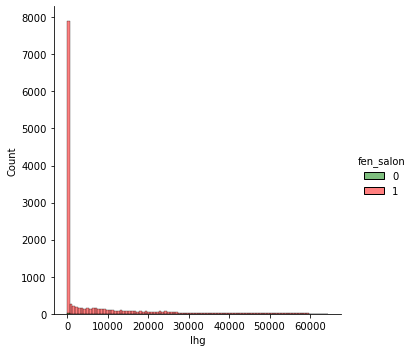

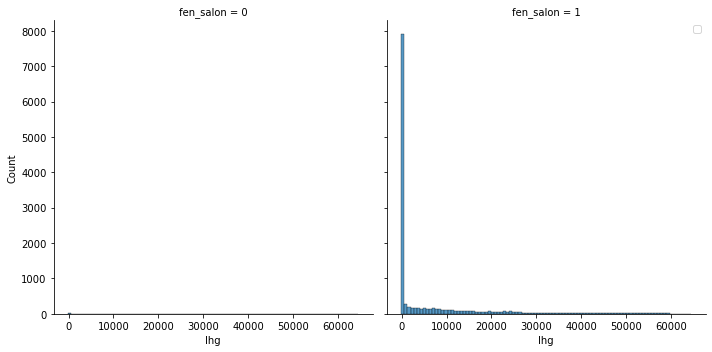

<Figure size 432x288 with 0 Axes>

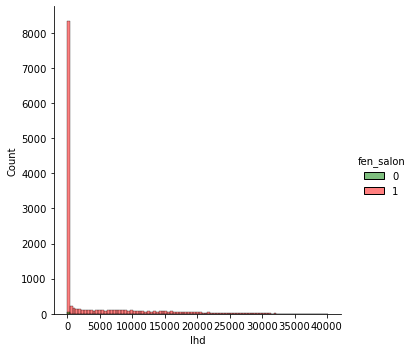

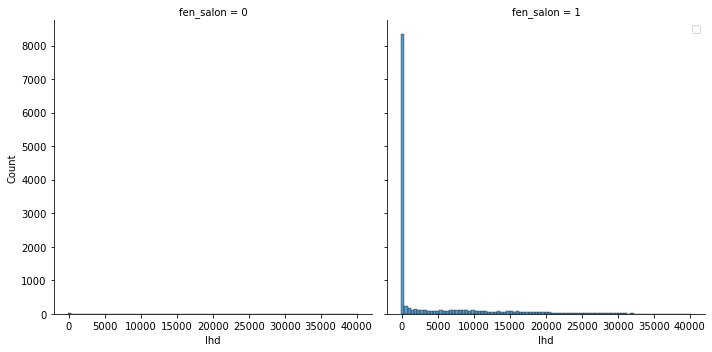

<Figure size 432x288 with 0 Axes>

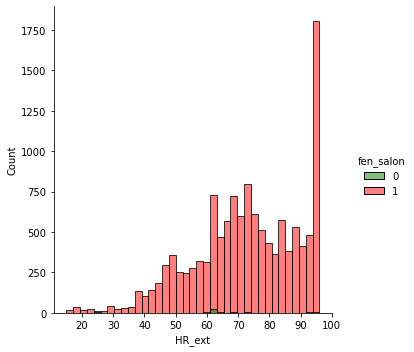

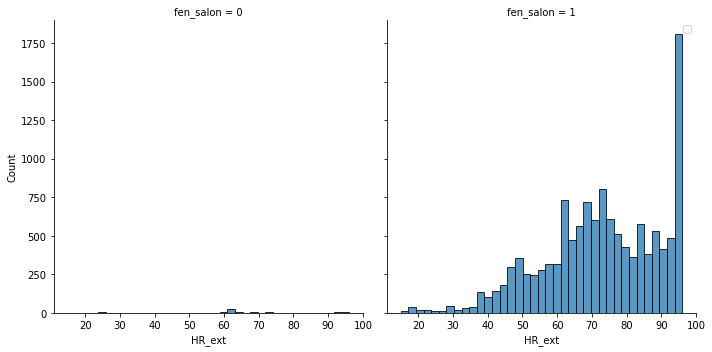

<Figure size 432x288 with 0 Axes>

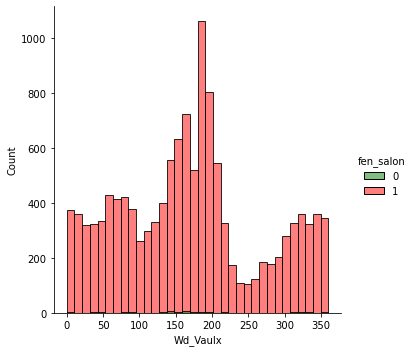

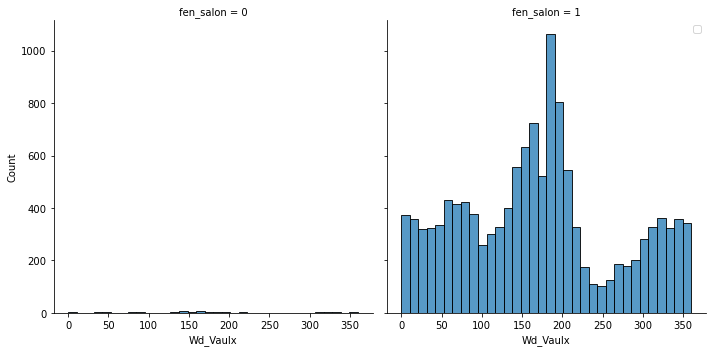

<Figure size 432x288 with 0 Axes>

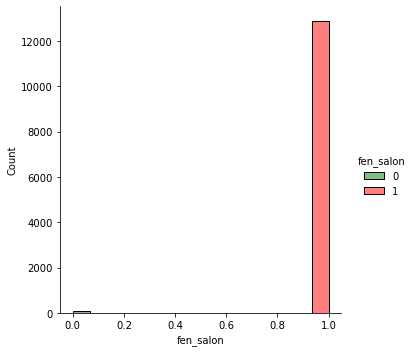

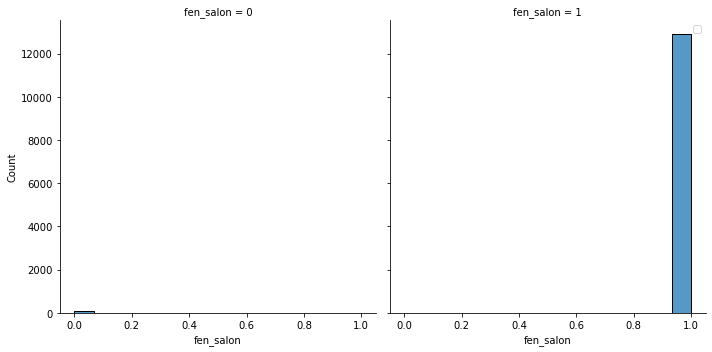

<Figure size 432x288 with 0 Axes>

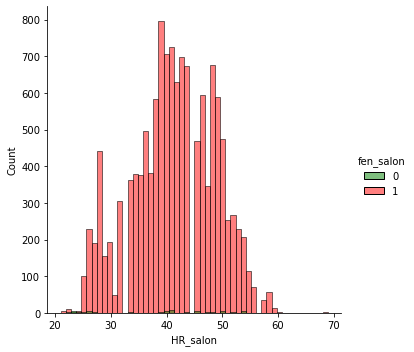

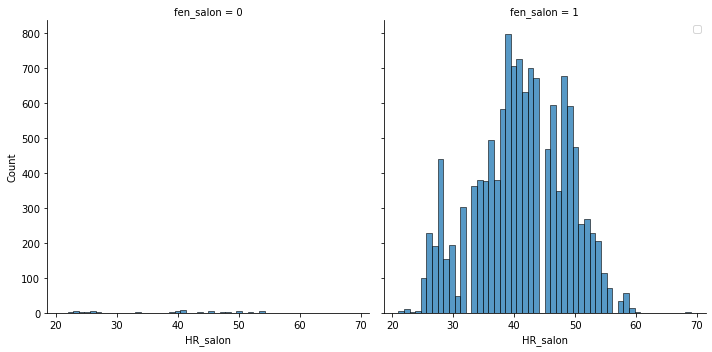

<Figure size 432x288 with 0 Axes>

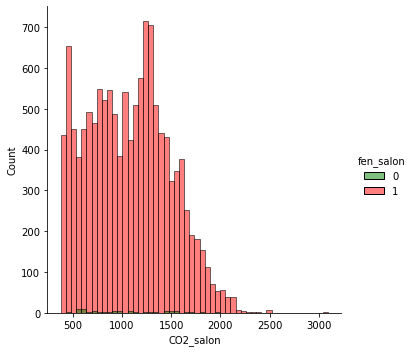

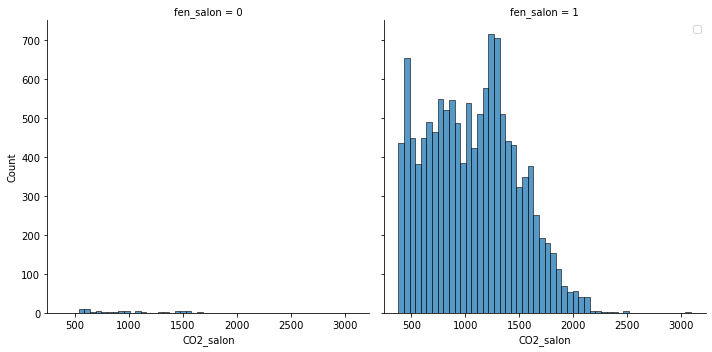

In [40]:
for col in dfs.select_dtypes('float'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()
for col in dfs.select_dtypes('int'):
    plt.figure()
    sns.displot(data=dfs,x=col,hue="fen_salon",palette=["g","r"])
    sns.displot(data=dfs,x=col,col="fen_salon",palette=["g","r"])
    plt.legend()    
    

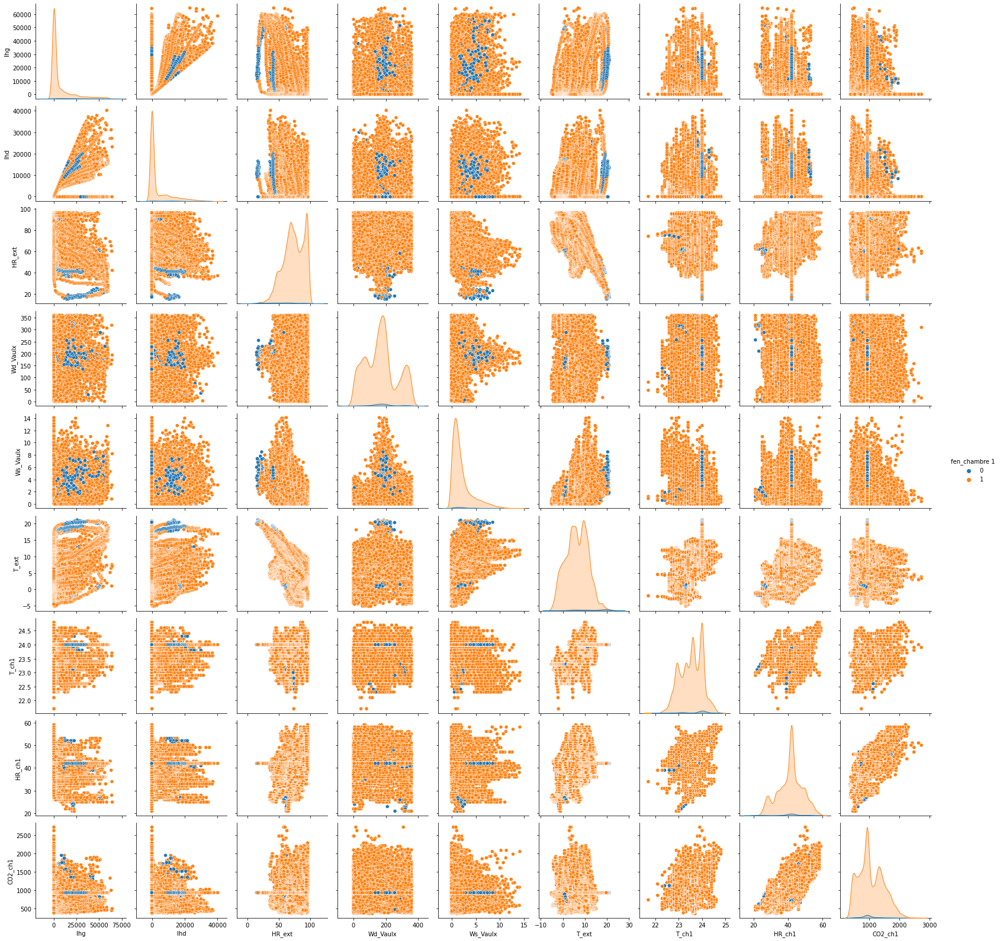

In [41]:
#CHAMBRE 1 
sns.pairplot(df1, hue="fen_chambre 1")

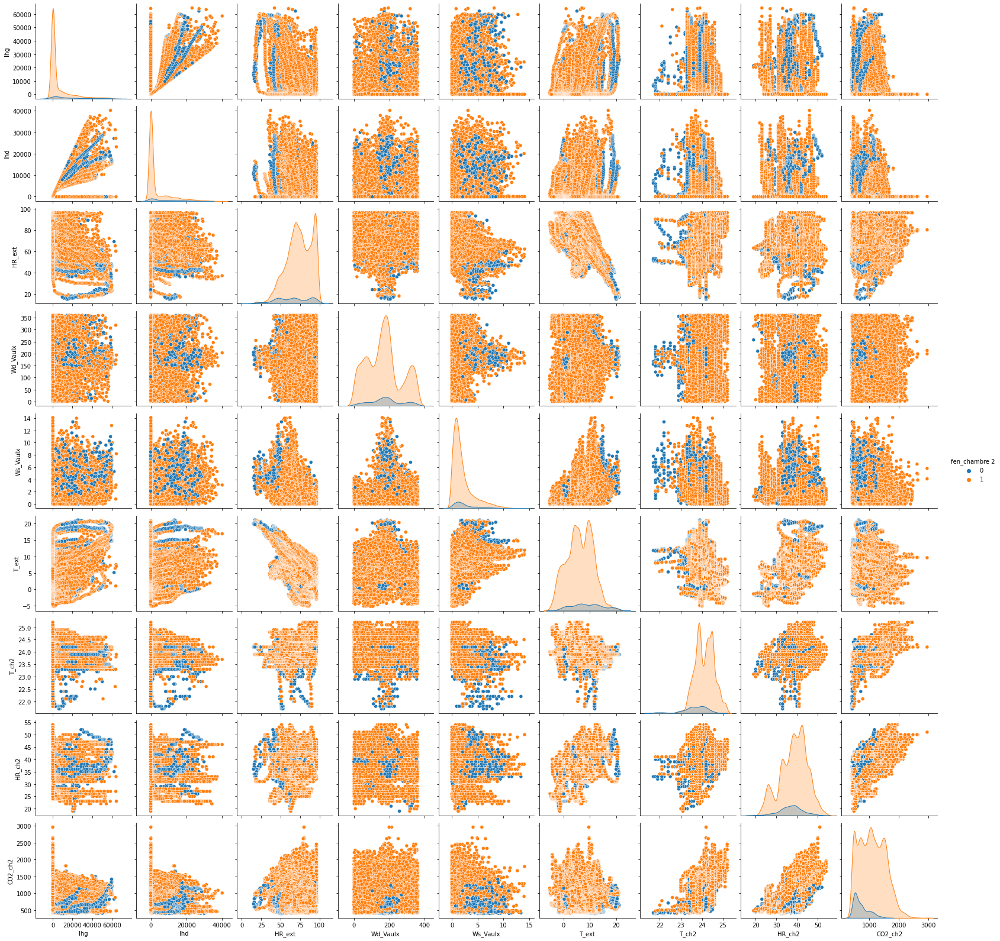

In [42]:
#CHAMBRE 2
sns.pairplot(df2, hue="fen_chambre 2")

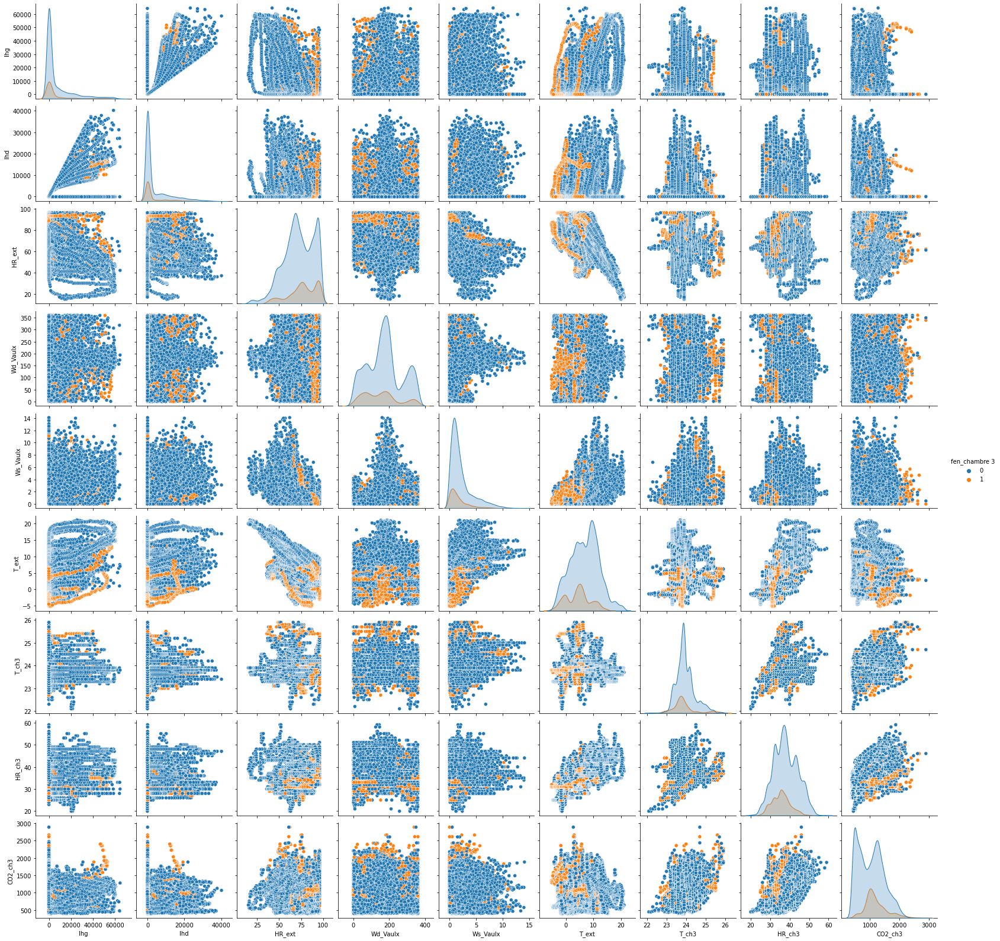

In [43]:
#CHAMBRE 3
sns.pairplot(df3, hue="fen_chambre 3")

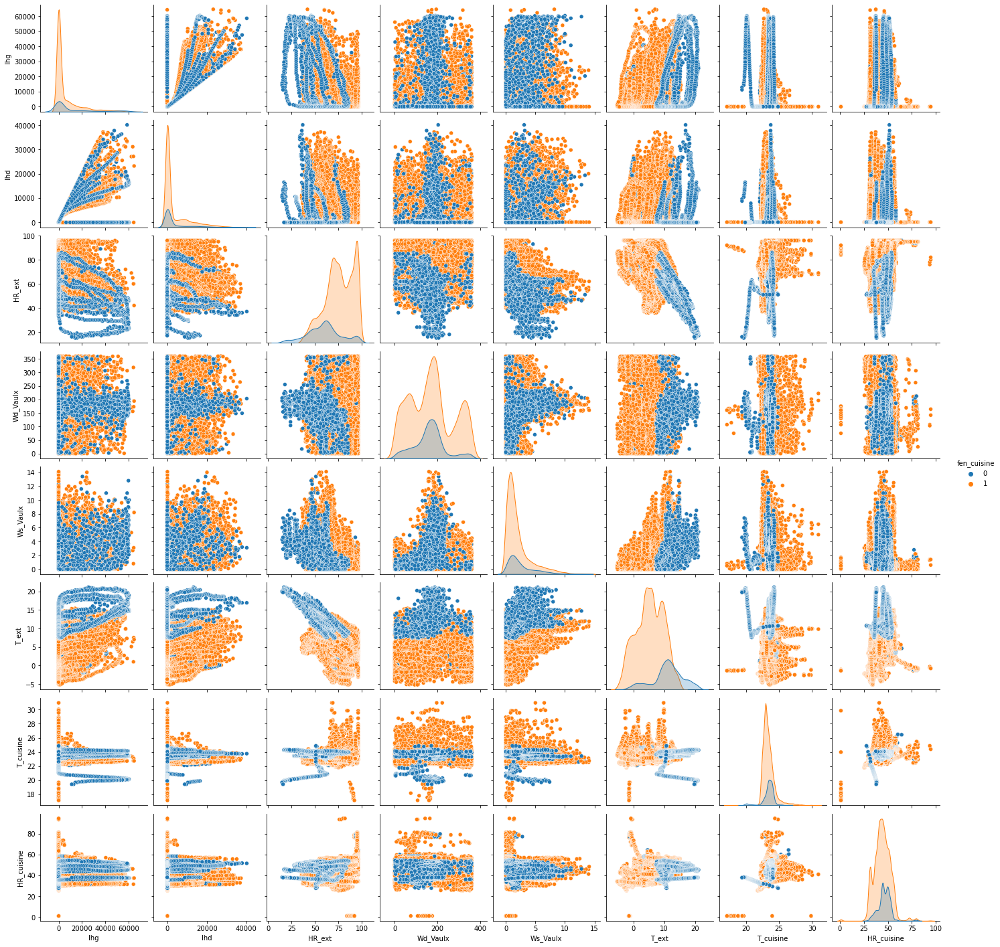

In [44]:
#CUISINE
sns.pairplot(dfc, hue="fen_cuisine")

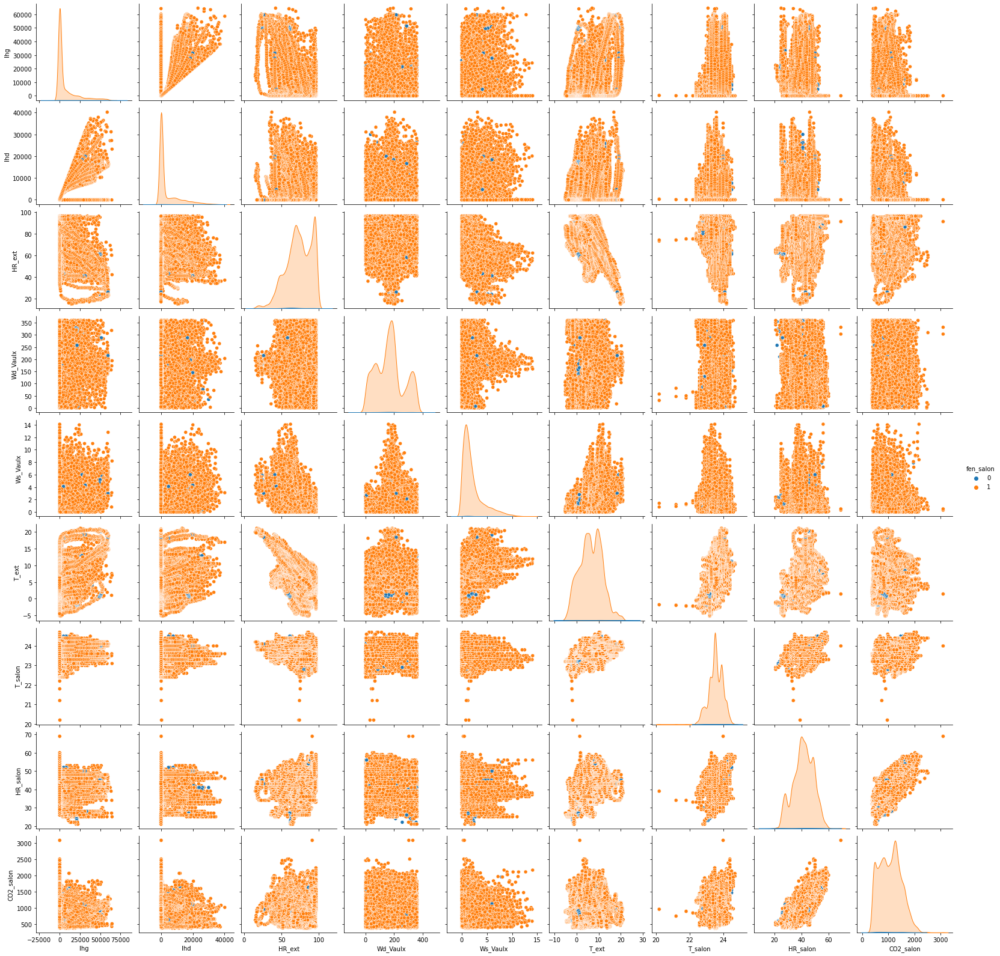

In [45]:
#SALON
sns.pairplot(dfs, hue="fen_salon")

In [46]:
import sweetviz as sv
rapport_Valloniere_R4_ch1=sv.analyze(df1) 
rapport_Valloniere_R4_ch1.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [47]:
rapport_Valloniere_R4_ch2=sv.analyze(df2) 
rapport_Valloniere_R4_ch2.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [48]:
rapport_Valloniere_R4_ch3=sv.analyze(df3) 
rapport_Valloniere_R4_ch3.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [49]:
rapport_Valloniere_R4_cuisine=sv.analyze(dfc) 
rapport_Valloniere_R4_cuisine.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [50]:
rapport_Valloniere_R4_salon=sv.analyze(dfs) 
rapport_Valloniere_R4_salon.show_html()
 

                                             |                                             | [  0%]   00:00 ->…

Report SWEETVIZ_REPORT.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


In [56]:
import dtale
df


,fen_ch1,T_ch1,HR_ch1,CO2_ch1,fen_ch2,T_ch2,HR_ch2,CO2_ch2,fen_ch3,T_ch3,HR_ch3,CO2_ch3,fen_cuisine,T_cuisine,HR_cuisine,fen_salon,T_salon,HR_salon,CO2_salon
Date,,,,,,,,,,,,,,,,,,,
2021-01-11 17:40:00,1.0,22.1,33.0,863.0,1.0,23.5,33.0,945.0,0.0,22.6,31.0,863.0,1.0,23.569,32.595,1.0,21.8,34.0,898.0
2021-01-11 17:45:00,1.0,22.1,33.0,863.0,1.0,23.5,33.0,945.0,0.0,22.6,31.0,863.0,1.0,23.569,32.595,1.0,21.8,34.0,898.0
2021-01-11 17:50:00,1.0,22.3,31.0,780.0,1.0,23.9,31.0,803.0,0.0,22.9,29.0,837.0,1.0,23.472,32.352,1.0,22.2,33.0,848.0
2021-01-11 17:55:00,1.0,22.3,31.0,780.0,1.0,23.9,31.0,803.0,1.0,22.9,29.0,837.0,1.0,23.472,32.352,1.0,22.2,33.0,848.0
2021-01-11 18:00:00,1.0,22.4,31.0,791.0,1.0,24.2,31.0,943.0,0.0,23.2,29.0,989.0,1.0,23.472,32.553,1.0,22.4,33.0,829.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-02-25 16:55:00,0.0,24.0,42.0,937.0,0.0,24.2,37.0,733.0,0.0,23.9,40.0,709.0,0.0,19.746,38.034,1.0,24.2,40.0,708.0
2021-02-25 17:00:00,0.0,24.0,42.0,937.0,0.0,24.2,36.0,681.0,0.0,23.9,39.0,643.0,0.0,19.674,38.091,1.0,24.2,39.0,629.0
2021-02-25 17:05:00,0.0,24.0,42.0,937.0,0.0,24.2,36.0,681.0,0.0,23.9,39.0,643.0,0.0,19.674,38.091,1.0,24.2,39.0,629.0


In [57]:
dfR4=dtale.show(df)
dfR4

In [24]:
meteo1

,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext
Date,,,,,,
2021-01-01 00:00:00,0,0,93,323,1.3,3.2
2021-01-01 00:01:00,0,0,93,317,0.6,3.2
2021-01-01 00:02:00,0,0,93,349,0.6,3.2
2021-01-01 00:03:00,0,0,93,339,0.2,3.2
2021-01-01 00:04:00,0,0,93,324,1.6,3.2
...,...,...,...,...,...,...
2021-02-28 23:55:00,0,0,71,271,1.0,6.2
2021-02-28 23:56:00,0,0,71,274,0.7,6.3
2021-02-28 23:57:00,0,0,71,290,0.2,6.3


In [27]:
pd.to_datetime(df1['Date'], format='%m/%d/%y')
df1=df1.set_index('Date')
df1_avec_date=df1.copy()
#df1=df1.loc['date début':'date fin']# si ya une anomalie dans les données en peu selection les dates quand veu prendre 
df1_avec_date['jour'] = df1_avec_date.index.weekday#day_name()
df1_avec_date['heure'] = df1_avec_date.index.hour
df1_avec_date['mois'] = df1_avec_date.index.month
#df1['nom de la journé']=df1.index.day_name()

#================== Chambre 2 ====================#

pd.to_datetime(df2['Date'], format='%m/%d/%y')
df2=df2.set_index('Date')
df2_avec_date=df2.copy()
#df2=df2.loc['2018-12-12 19:00:00':'2019-03-24 12:00:00']
df2_avec_date['jour'] = df2_avec_date.index.weekday#day_name()
df2_avec_date['heure'] = df2_avec_date.index.hour
df2_avec_date['mois'] = df2_avec_date.index.month
#================== Chambre 3 ====================#

pd.to_datetime(df3['Date'], format='%m/%d/%y')
df3=df3.set_index('Date')
df3_avec_date=df3.copy()
#df2=df2.loc['2018-12-12 19:00:00':'2019-03-24 12:00:00']
df3_avec_date['jour'] = df3_avec_date.index.weekday#day_name()
df3_avec_date['heure'] = df3_avec_date.index.hour
df3_avec_date['mois'] = df3_avec_date.index.month

#=================== Cuisine =====================#

pd.to_datetime(dfc['Date'], format='%m/%d/%y')
dfc=dfc.set_index('Date')
dfc_avec_date=dfc.copy()
#dfc=dfc.loc['':'']
dfc_avec_date['jour'] = dfc_avec_date.index.weekday#day_name()
dfc_avec_date['heure'] = dfc_avec_date.index.hour
dfc_avec_date['mois'] = dfc_avec_date.index.month
#==================== salon ======================#

pd.to_datetime(dfs['Date'], format='%m/%d/%y')
dfs=dfs.set_index('Date')
dfs_avec_date=dfs.copy()
#dfs=dfs.loc['':'']
dfs_avec_date['jour'] = dfs_avec_date.index.weekday#day_name()
dfs_avec_date['heure'] = dfs_avec_date.index.hour
dfs_avec_date['mois'] = dfs_avec_date.index.month

In [28]:

#supprimé les valeurs manquantes pour tout les fenetres 
df1.dropna(axis = 0, how = 'any',inplace=True)
df2.dropna(axis = 0, how = 'any',inplace=True)
df3.dropna(axis = 0, how = 'any',inplace=True)
dfc.dropna(axis = 0, how = 'any',inplace=True)
dfs.dropna(axis = 0, how = 'any',inplace=True)
df1_avec_date.dropna(axis = 0, how = 'any',inplace=True)
df2_avec_date.dropna(axis = 0, how = 'any',inplace=True)
df3_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfc_avec_date.dropna(axis = 0, how = 'any',inplace=True)
dfs_avec_date.dropna(axis = 0, how = 'any',inplace=True)





In [29]:
#=== Data normale ====#
y1 = df1['fen_chambre 1']
X1 = df1.drop(['fen_chambre 1'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X1_ = df1.drop(['fen_chambre 1','HR_ext'], axis=1)
#======= Data normal  L'heure et le joure  ========#
X1_avec_date = df1_avec_date.drop(['fen_chambre 1'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X1_avec_date_ = df1_avec_date.drop(['fen_chambre 1','HR_ext'], axis=1)


                  #==================== Chambre 2 =============================#
    
#=== Data normale ====#    
y2 = df2['fen_chambre 2']
X2 = df2.drop(['fen_chambre 2'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X2_ = df2.drop(['fen_chambre 2','HR_ext'], axis=1)
#======= Data L'heure et le joure  ========# 
X2_avec_date = df2_avec_date.drop(['fen_chambre 2'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X2_avec_date_ = df2_avec_date.drop(['fen_chambre 2','HR_ext'], axis=1)

                  #==================== Chambre 3 =============================#
    
#=== Data normale ====#    
y3 = df3['fen_chambre 3']
X3 = df3.drop(['fen_chambre 3'], axis=1)
#==== suprimé le HR_ext , IHD ========#
X3_ = df3.drop(['fen_chambre 3','HR_ext'], axis=1)
#======= Data L'heure et le joure  ========# 
X3_avec_date = df3_avec_date.drop(['fen_chambre 3'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
X3_avec_date_ = df3_avec_date.drop(['fen_chambre 3','HR_ext','Ihd'], axis=1)



                  #====================== Cuisine ===========================#
    
#=== Data normale ====# 
yc = dfc['fen_cuisine']
Xc = dfc.drop(['fen_cuisine'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xc_ = dfc.drop(['fen_cuisine','HR_ext'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xc_avec_date = dfc_avec_date.drop(['fen_cuisine'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xc_avec_date_ = dfc_avec_date.drop(['fen_cuisine','HR_ext','Ihd'], axis=1)

                  #======================= Salon =========================#
    
#=== Data normale ====# 
ys = dfs['fen_salon']
Xs = dfs.drop(['fen_salon'], axis=1)
#==== suprimé le HR_ext , IHD ========#
Xs_ = dfs.drop(['fen_salon','HR_ext'], axis=1)
#======= Data normal avec  L'heure et le joure  ========#
Xs_avec_date = dfs_avec_date.drop(['fen_salon'], axis=1)
#======= Data avec  L'heure et le joure et Sans HR_ext et Ihd  ========#
Xs_avec_date_ = dfs_avec_date.drop(['fen_salon','HR_ext','Ihd'], axis=1)


In [26]:
from sklearn.preprocessing import StandardScaler
#=======================================#
scaler1=StandardScaler()
scaler1.fit(X1)
X1_scaled=scaler1.transform(X1)
X1_scaled=pd.DataFrame(X1_scaled)
X1_scaled.columns=X1.columns
#=======================================#
scaler2=StandardScaler()
scaler2.fit(X2)
X2_scaled=scaler2.transform(X2)
X2_scaled=pd.DataFrame(X2_scaled)
X2_scaled.columns=X2.columns
#=======================================#
scaler3=StandardScaler()
scaler3.fit(X3)
X3_scaled=scaler3.transform(X3)
X3_scaled=pd.DataFrame(X3_scaled)
X3_scaled.columns=X3.columns
#=======================================#
scaler_c=StandardScaler()
scaler_c.fit(Xc)
Xc_scaled=scaler_c.transform(Xc)
Xc_scaled=pd.DataFrame(Xc_scaled)
Xc_scaled.columns=Xc.columns
#=======================================#
scaler_s=StandardScaler()
scaler_s.fit(Xs)
Xs_scaled=scaler_s.transform(Xs)
Xs_scaled=pd.DataFrame(Xs_scaled)
Xs_scaled.columns=Xs.columns
#=======================================#

In [30]:
display(Xc,Xc_,Xc_avec_date,Xc_avec_date_)

,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,T_cuisine,HR_cuisine
Date,,,,,,,,
2021-01-11 17:30:00,107,107,74,47,1.2,-1.9,23.400,31.844
2021-01-11 17:35:00,46,46,74,81,0.9,-2.0,23.400,31.844
2021-01-11 17:40:00,30,30,75,41,1.2,-2.1,23.569,32.595
2021-01-11 17:45:00,30,30,75,50,1.3,-2.2,23.569,32.595
2021-01-11 17:50:00,0,0,75,64,1.5,-2.3,23.472,32.352
...,...,...,...,...,...,...,...,...
2021-02-25 16:55:00,16660,11668,16,191,2.9,20.1,19.746,38.034
2021-02-25 17:00:00,15620,11075,15,195,4.3,20.0,19.674,38.091
2021-02-25 17:05:00,14250,10351,15,205,6.0,19.9,19.674,38.091


,Ihg,Ihd,Wd_Vaulx,Ws_Vaulx,T_ext,T_cuisine,HR_cuisine
Date,,,,,,,
2021-01-11 17:30:00,107,107,47,1.2,-1.9,23.400,31.844
2021-01-11 17:35:00,46,46,81,0.9,-2.0,23.400,31.844
2021-01-11 17:40:00,30,30,41,1.2,-2.1,23.569,32.595
2021-01-11 17:45:00,30,30,50,1.3,-2.2,23.569,32.595
2021-01-11 17:50:00,0,0,64,1.5,-2.3,23.472,32.352
...,...,...,...,...,...,...,...
2021-02-25 16:55:00,16660,11668,191,2.9,20.1,19.746,38.034
2021-02-25 17:00:00,15620,11075,195,4.3,20.0,19.674,38.091
2021-02-25 17:05:00,14250,10351,205,6.0,19.9,19.674,38.091


,Ihg,Ihd,HR_ext,Wd_Vaulx,Ws_Vaulx,T_ext,T_cuisine,HR_cuisine,jour,heure,mois
Date,,,,,,,,,,,
2021-01-11 17:30:00,107,107,74,47,1.2,-1.9,23.400,31.844,0,17,1
2021-01-11 17:35:00,46,46,74,81,0.9,-2.0,23.400,31.844,0,17,1
2021-01-11 17:40:00,30,30,75,41,1.2,-2.1,23.569,32.595,0,17,1
2021-01-11 17:45:00,30,30,75,50,1.3,-2.2,23.569,32.595,0,17,1
2021-01-11 17:50:00,0,0,75,64,1.5,-2.3,23.472,32.352,0,17,1
...,...,...,...,...,...,...,...,...,...,...,...
2021-02-25 16:55:00,16660,11668,16,191,2.9,20.1,19.746,38.034,3,16,2
2021-02-25 17:00:00,15620,11075,15,195,4.3,20.0,19.674,38.091,3,17,2
2021-02-25 17:05:00,14250,10351,15,205,6.0,19.9,19.674,38.091,3,17,2


,Ihg,Wd_Vaulx,Ws_Vaulx,T_ext,T_cuisine,HR_cuisine,jour,heure,mois
Date,,,,,,,,,
2021-01-11 17:30:00,107,47,1.2,-1.9,23.400,31.844,0,17,1
2021-01-11 17:35:00,46,81,0.9,-2.0,23.400,31.844,0,17,1
2021-01-11 17:40:00,30,41,1.2,-2.1,23.569,32.595,0,17,1
2021-01-11 17:45:00,30,50,1.3,-2.2,23.569,32.595,0,17,1
2021-01-11 17:50:00,0,64,1.5,-2.3,23.472,32.352,0,17,1
...,...,...,...,...,...,...,...,...,...
2021-02-25 16:55:00,16660,191,2.9,20.1,19.746,38.034,3,16,2
2021-02-25 17:00:00,15620,195,4.3,20.0,19.674,38.091,3,17,2
2021-02-25 17:05:00,14250,205,6.0,19.9,19.674,38.091,3,17,2


In [31]:
from sklearn.preprocessing import StandardScaler
#=======================================#
scaler1=StandardScaler()
scaler1.fit(X1_avec_date)
X1_scaled=scaler1.transform(X1_avec_date)
X1_scaled=pd.DataFrame(X1_scaled)
X1_scaled.columns=X1_avec_date.columns
#=======================================#
scaler2=StandardScaler()
scaler2.fit(X2_avec_date)
X2_scaled=scaler2.transform(X2_avec_date)
X2_scaled=pd.DataFrame(X2_scaled)
X2_scaled.columns=X2_avec_date.columns
#=======================================#
scaler3=StandardScaler()
scaler3.fit(X3_avec_date)
X3_scaled=scaler3.transform(X3_avec_date)
X3_scaled=pd.DataFrame(X3_scaled)
X3_scaled.columns=X3_avec_date.columns
#=======================================#
scaler_c=StandardScaler()
scaler_c.fit(Xc_avec_date)
Xc_scaled=scaler_c.transform(Xc_avec_date)
Xc_scaled=pd.DataFrame(Xc_scaled)
Xc_scaled.columns=Xc_avec_date.columns
#=======================================#
scaler_s=StandardScaler()
scaler_s.fit(Xs_avec_date)
Xs_scaled=scaler_s.transform(Xs_avec_date)
Xs_scaled=pd.DataFrame(Xs_scaled)
Xs_scaled.columns=Xs_avec_date.columns
#=======================================#

# Chambre 1


In [32]:

X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.2, random_state=4)
print('Train set:', X1_train.shape)
print('Test set:', X1_test.shape)
display(y1_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y1_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y1_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y1_test.value_counts(normalize=True))

Train set: (10367, 12)
Test set: (2592, 12)


1    10173
0      194
Name: fen_chambre 1, dtype: int64

1    2547
0      45
Name: fen_chambre 1, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.981287
0    0.018713
Name: fen_chambre 1, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.982639
0    0.017361
Name: fen_chambre 1, dtype: float64

In [33]:
importance(evaluation,X1_scaled)


DecisionTreeClassifier
[[  33   12]
 [  20 2527]]
              precision    recall  f1-score   support

           0       0.62      0.73      0.67        45
           1       1.00      0.99      0.99      2547

    accuracy                           0.99      2592
   macro avg       0.81      0.86      0.83      2592
weighted avg       0.99      0.99      0.99      2592



,importance
T_ext,0.275107
Ihg,0.149931
Ihd,0.127015
HR_ext,0.093338
HR_ch1,0.077873
jour,0.071324
CO2_ch1,0.062270
Wd_Vaulx,0.046369
T_ch1,0.043673
Ws_Vaulx,0.029822


RandomForest
[[  32   13]
 [   6 2541]]
              precision    recall  f1-score   support

           0       0.84      0.71      0.77        45
           1       0.99      1.00      1.00      2547

    accuracy                           0.99      2592
   macro avg       0.92      0.85      0.88      2592
weighted avg       0.99      0.99      0.99      2592



,importance
T_ext,0.208433
HR_ext,0.126556
Ihg,0.124883
Ihd,0.093640
heure,0.087739
HR_ch1,0.067642
CO2_ch1,0.064343
jour,0.062853
Wd_Vaulx,0.059950
T_ch1,0.050482


AdaBoost
[[  13   32]
 [   9 2538]]
              precision    recall  f1-score   support

           0       0.59      0.29      0.39        45
           1       0.99      1.00      0.99      2547

    accuracy                           0.98      2592
   macro avg       0.79      0.64      0.69      2592
weighted avg       0.98      0.98      0.98      2592



,importance
T_ext,0.22
jour,0.14
HR_ch1,0.12
heure,0.12
Ihd,0.10
T_ch1,0.08
HR_ext,0.06
Ws_Vaulx,0.06
CO2_ch1,0.06
Ihg,0.04


XGboost
[13:28:25] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[  35   10]
 [   3 2544]]
              precision    recall  f1-score   support

           0       0.92      0.78      0.84        45
           1       1.00      1.00      1.00      2547

    accuracy                           0.99      2592
   macro avg       0.96      0.89      0.92      2592
weighted avg       0.99      0.99      0.99      2592



,importance
HR_ch1,0.148710
mois,0.134112
jour,0.119596
T_ext,0.112529
heure,0.107195
Ihg,0.097927
Ihd,0.060430
T_ch1,0.058462
HR_ext,0.056912
CO2_ch1,0.049180


Regression_logistic
[[   0   45]
 [   0 2547]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        45
           1       0.98      1.00      0.99      2547

    accuracy                           0.98      2592
   macro avg       0.49      0.50      0.50      2592
weighted avg       0.97      0.98      0.97      2592

SVM
[[  18   27]
 [   4 2543]]
              precision    recall  f1-score   support

           0       0.82      0.40      0.54        45
           1       0.99      1.00      0.99      2547

    accuracy                           0.99      2592
   macro avg       0.90      0.70      0.77      2592
weighted avg       0.99      0.99      0.99      2592

KNN
[[  26   19]
 [  10 2537]]
              precision    recall  f1-score   support

           0       0.72      0.58      0.64        45
           1       0.99      1.00      0.99      2547

    accuracy                           0.99      2592
   macro avg       

In [34]:
rf = RandomForestClassifier()
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
Kfold=KFold(n_splits=5, shuffle=True,random_state=0)
sc=cross_val_score(rf,X1_avec_date,y1,cv=Kfold)
sc.mean()


0.9925149853957909

In [35]:
# jeux train+validation set et test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X1_avec_date, y1,test_size=0.2, random_state=5)
# jeux train+validation set en training et  validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
    #       for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evalué le Rf dans validation set
                score = rf.score(X_valid, y_valid)
        
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))

Size of training set: 8293   size of validation set: 2074   size of test set: 2592

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 300, 'max_depth': 22}
Test set score with best parameters: 0.99
[[  39   16]
 [   0 2537]]
              precision    recall  f1-score   support

           0       1.00      0.71      0.83        55
           1       0.99      1.00      1.00      2537

    accuracy                           0.99      2592
   macro avg       1.00      0.85      0.91      2592
weighted avg       0.99      0.99      0.99      2592



# chambre 2


In [38]:

X2_train, X2_test, y2_train, y2_test = train_test_split(X2_scaled, y2, test_size=0.2, random_state=5)
print('Train set:', X2_train.shape)
print('Test set:', X2_test.shape)
display(y2_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y2_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y2_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y2_test.value_counts(normalize=True))

Train set: (10365, 12)
Test set: (2592, 12)


1    9452
0     913
Name: fen_chambre 2, dtype: int64

1    2351
0     241
Name: fen_chambre 2, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.911915
0    0.088085
Name: fen_chambre 2, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.907022
0    0.092978
Name: fen_chambre 2, dtype: float64

In [39]:
importance(evaluation2,X2_scaled)

DecisionTreeClassifier
[[ 211   30]
 [  29 2322]]
              precision    recall  f1-score   support

           0       0.88      0.88      0.88       241
           1       0.99      0.99      0.99      2351

    accuracy                           0.98      2592
   macro avg       0.93      0.93      0.93      2592
weighted avg       0.98      0.98      0.98      2592



,importance
Ihg,0.155440
T_ch2,0.143192
CO2_ch2,0.132696
HR_ext,0.122999
heure,0.118522
T_ext,0.109241
HR_ch2,0.080381
jour,0.057999
Wd_Vaulx,0.023647
mois,0.023072


RandomForest
[[ 212   29]
 [  14 2337]]
              precision    recall  f1-score   support

           0       0.94      0.88      0.91       241
           1       0.99      0.99      0.99      2351

    accuracy                           0.98      2592
   macro avg       0.96      0.94      0.95      2592
weighted avg       0.98      0.98      0.98      2592



,importance
CO2_ch2,0.128617
T_ch2,0.121129
T_ext,0.120517
Ihg,0.107161
HR_ch2,0.093283
heure,0.092029
HR_ext,0.088968
jour,0.070220
Ihd,0.066708
Ws_Vaulx,0.041217


AdaBoost
[[ 116  125]
 [  44 2307]]
              precision    recall  f1-score   support

           0       0.72      0.48      0.58       241
           1       0.95      0.98      0.96      2351

    accuracy                           0.93      2592
   macro avg       0.84      0.73      0.77      2592
weighted avg       0.93      0.93      0.93      2592



,importance
T_ext,0.18
CO2_ch2,0.16
T_ch2,0.14
heure,0.10
Ihg,0.08
HR_ext,0.08
HR_ch2,0.08
Ihd,0.06
Ws_Vaulx,0.04
jour,0.04


XGboost
[13:38:54] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 224   17]
 [  15 2336]]
              precision    recall  f1-score   support

           0       0.94      0.93      0.93       241
           1       0.99      0.99      0.99      2351

    accuracy                           0.99      2592
   macro avg       0.97      0.96      0.96      2592
weighted avg       0.99      0.99      0.99      2592



,importance
Ihg,0.142814
HR_ch2,0.133043
heure,0.124977
mois,0.122442
T_ch2,0.118809
jour,0.092773
HR_ext,0.071989
T_ext,0.069945
CO2_ch2,0.053957
Ws_Vaulx,0.026097


Regression_logistic
[[  65  176]
 [  18 2333]]
              precision    recall  f1-score   support

           0       0.78      0.27      0.40       241
           1       0.93      0.99      0.96      2351

    accuracy                           0.93      2592
   macro avg       0.86      0.63      0.68      2592
weighted avg       0.92      0.93      0.91      2592

SVM
[[ 175   66]
 [  18 2333]]
              precision    recall  f1-score   support

           0       0.91      0.73      0.81       241
           1       0.97      0.99      0.98      2351

    accuracy                           0.97      2592
   macro avg       0.94      0.86      0.89      2592
weighted avg       0.97      0.97      0.97      2592

KNN
[[ 203   38]
 [  36 2315]]
              precision    recall  f1-score   support

           0       0.85      0.84      0.85       241
           1       0.98      0.98      0.98      2351

    accuracy                           0.97      2592
   macro avg       

In [40]:

sc2=cross_val_score(rf,X2_avec_date,y2,cv=Kfold)
sc2.mean()

0.9893493503151936

In [41]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X2_avec_date, y2,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 8292   size of validation set: 2073   size of test set: 2592

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 100, 'max_depth': 22}
Test set score with best parameters: 0.98
[[ 217   24]
 [  15 2336]]
              precision    recall  f1-score   support

           0       0.94      0.90      0.92       241
           1       0.99      0.99      0.99      2351

    accuracy                           0.98      2592
   macro avg       0.96      0.95      0.95      2592
weighted avg       0.98      0.98      0.98      2592



In [42]:

X3_train, X3_test, y3_train, y3_test = train_test_split(X3_scaled, y3, test_size=0.2, random_state=5)
print('Train set:', X3_train.shape)
print('Test set:', X3_test.shape)
display(y3_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(y3_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(y3_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(y3_test.value_counts(normalize=True))

Train set: (10365, 12)
Test set: (2592, 12)


0    8556
1    1809
Name: fen_chambre 3, dtype: int64

0    2139
1     453
Name: fen_chambre 3, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


0    0.82547
1    0.17453
Name: fen_chambre 3, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


0    0.825231
1    0.174769
Name: fen_chambre 3, dtype: float64

In [43]:
importance(evaluation3,X3_scaled)

DecisionTreeClassifier
[[2074   65]
 [  65  388]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      2139
           1       0.86      0.86      0.86       453

    accuracy                           0.95      2592
   macro avg       0.91      0.91      0.91      2592
weighted avg       0.95      0.95      0.95      2592



,importance
T_ch3,0.149226
T_ext,0.144543
heure,0.137207
CO2_ch3,0.134939
jour,0.128241
HR_ch3,0.113934
HR_ext,0.050526
Wd_Vaulx,0.045691
Ws_Vaulx,0.040758
mois,0.025007


RandomForest
[[2113   26]
 [  55  398]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2139
           1       0.94      0.88      0.91       453

    accuracy                           0.97      2592
   macro avg       0.96      0.93      0.94      2592
weighted avg       0.97      0.97      0.97      2592



,importance
CO2_ch3,0.165418
T_ch3,0.129315
T_ext,0.125954
heure,0.106867
HR_ch3,0.099679
HR_ext,0.093431
jour,0.072398
Ws_Vaulx,0.060159
Wd_Vaulx,0.054986
Ihg,0.035057


AdaBoost
[[2075   64]
 [ 255  198]]
              precision    recall  f1-score   support

           0       0.89      0.97      0.93      2139
           1       0.76      0.44      0.55       453

    accuracy                           0.88      2592
   macro avg       0.82      0.70      0.74      2592
weighted avg       0.87      0.88      0.86      2592



,importance
T_ch3,0.18
CO2_ch3,0.18
T_ext,0.16
HR_ch3,0.10
jour,0.10
HR_ext,0.08
Ihd,0.06
heure,0.06
Wd_Vaulx,0.04
Ws_Vaulx,0.02


XGboost
[13:41:47] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[2111   28]
 [  63  390]]
              precision    recall  f1-score   support

           0       0.97      0.99      0.98      2139
           1       0.93      0.86      0.90       453

    accuracy                           0.96      2592
   macro avg       0.95      0.92      0.94      2592
weighted avg       0.96      0.96      0.96      2592



,importance
mois,0.177467
jour,0.142654
T_ch3,0.122462
HR_ch3,0.102340
heure,0.095635
T_ext,0.090846
CO2_ch3,0.080630
HR_ext,0.053801
Ihg,0.052952
Ihd,0.030926


Regression_logistic
[[2074   65]
 [ 398   55]]
              precision    recall  f1-score   support

           0       0.84      0.97      0.90      2139
           1       0.46      0.12      0.19       453

    accuracy                           0.82      2592
   macro avg       0.65      0.55      0.55      2592
weighted avg       0.77      0.82      0.78      2592

SVM
[[2083   56]
 [ 149  304]]
              precision    recall  f1-score   support

           0       0.93      0.97      0.95      2139
           1       0.84      0.67      0.75       453

    accuracy                           0.92      2592
   macro avg       0.89      0.82      0.85      2592
weighted avg       0.92      0.92      0.92      2592

KNN
[[2084   55]
 [  69  384]]
              precision    recall  f1-score   support

           0       0.97      0.97      0.97      2139
           1       0.87      0.85      0.86       453

    accuracy                           0.95      2592
   macro avg       

In [44]:

sc3=cross_val_score(rf,X3_avec_date,y3,cv=Kfold)
sc3.mean()

0.9663501329388051

In [45]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(X3_avec_date, y3,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 8292   size of validation set: 2073   size of test set: 2592

Best score on validation set: 0.97
Best parameters:  {'n_estimators': 100, 'max_depth': 26}
Test set score with best parameters: 0.97
[[2108   31]
 [  53  400]]
              precision    recall  f1-score   support

           0       0.98      0.99      0.98      2139
           1       0.93      0.88      0.90       453

    accuracy                           0.97      2592
   macro avg       0.95      0.93      0.94      2592
weighted avg       0.97      0.97      0.97      2592



# Cuisine

In [46]:
Xc_train, Xc_test, yc_train, yc_test = train_test_split(Xc_scaled, yc, test_size=0.2, random_state=20)
print('Train set:', Xc_train.shape)
print('Test set:', Xc_test.shape)
display(yc_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(yc_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(yc_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(yc_test.value_counts(normalize=True))

Train set: (10366, 11)
Test set: (2592, 11)


1    8377
0    1989
Name: fen_cuisine, dtype: int64

1    2091
0     501
Name: fen_cuisine, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.808123
0    0.191877
Name: fen_cuisine, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.806713
0    0.193287
Name: fen_cuisine, dtype: float64

In [47]:
importance(evaluation_c,Xc_scaled)

DecisionTreeClassifier
[[ 465   36]
 [  40 2051]]
              precision    recall  f1-score   support

           0       0.92      0.93      0.92       501
           1       0.98      0.98      0.98      2091

    accuracy                           0.97      2592
   macro avg       0.95      0.95      0.95      2592
weighted avg       0.97      0.97      0.97      2592



,importance
T_ext,0.322938
HR_cuisine,0.123031
T_cuisine,0.121290
jour,0.120001
HR_ext,0.090697
heure,0.075917
Ihg,0.038328
Wd_Vaulx,0.038172
Ihd,0.030684
Ws_Vaulx,0.028118


RandomForest
[[ 482   19]
 [   6 2085]]
              precision    recall  f1-score   support

           0       0.99      0.96      0.97       501
           1       0.99      1.00      0.99      2091

    accuracy                           0.99      2592
   macro avg       0.99      0.98      0.98      2592
weighted avg       0.99      0.99      0.99      2592



,importance
T_ext,0.212969
HR_ext,0.155279
T_cuisine,0.141543
HR_cuisine,0.115255
jour,0.083187
heure,0.073183
mois,0.050689
Ihd,0.048972
Wd_Vaulx,0.043105
Ihg,0.038356


AdaBoost
[[ 276  225]
 [  43 2048]]
              precision    recall  f1-score   support

           0       0.87      0.55      0.67       501
           1       0.90      0.98      0.94      2091

    accuracy                           0.90      2592
   macro avg       0.88      0.77      0.81      2592
weighted avg       0.89      0.90      0.89      2592



,importance
T_ext,0.20
T_cuisine,0.20
HR_cuisine,0.18
Ihd,0.08
HR_ext,0.08
jour,0.08
heure,0.08
Wd_Vaulx,0.04
Ws_Vaulx,0.04
mois,0.02


XGboost
[13:43:54] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[ 480   21]
 [   8 2083]]
              precision    recall  f1-score   support

           0       0.98      0.96      0.97       501
           1       0.99      1.00      0.99      2091

    accuracy                           0.99      2592
   macro avg       0.99      0.98      0.98      2592
weighted avg       0.99      0.99      0.99      2592



,importance
T_ext,0.189820
mois,0.145166
jour,0.139026
T_cuisine,0.087813
heure,0.087105
HR_ext,0.085104
HR_cuisine,0.075513
Ihd,0.072090
Ihg,0.044424
Ws_Vaulx,0.037130


Regression_logistic
[[ 202  299]
 [  56 2035]]
              precision    recall  f1-score   support

           0       0.78      0.40      0.53       501
           1       0.87      0.97      0.92      2091

    accuracy                           0.86      2592
   macro avg       0.83      0.69      0.73      2592
weighted avg       0.85      0.86      0.84      2592

SVM
[[ 363  138]
 [   4 2087]]
              precision    recall  f1-score   support

           0       0.99      0.72      0.84       501
           1       0.94      1.00      0.97      2091

    accuracy                           0.95      2592
   macro avg       0.96      0.86      0.90      2592
weighted avg       0.95      0.95      0.94      2592

KNN
[[ 457   44]
 [  34 2057]]
              precision    recall  f1-score   support

           0       0.93      0.91      0.92       501
           1       0.98      0.98      0.98      2091

    accuracy                           0.97      2592
   macro avg       

In [48]:
scc=cross_val_score(rf,Xc_avec_date,yc,cv=Kfold)
scc.mean()

0.9881924193909593

In [49]:

# split data into train+validation set and test set
X_trainval, X_test, y_trainval, y_test = train_test_split(Xc_avec_date, yc,test_size=0.2, random_state=5)
# split train+validation set into training and validation sets
X_train, X_valid, y_train, y_valid = train_test_split(X_trainval, y_trainval,test_size=0.2, random_state=5)
print("Size of training set: {}   size of validation set: {}   size of test set:"
      " {}\n".format(X_train.shape[0], X_valid.shape[0], X_test.shape[0]))
best_score=0
for n_estimators in [100,200,300,400]:
    for max_depth in [20,22,26,28]:
       # for  min_samples_leaf in [1,2,3]:
           for max_features in ['auto']:
                # for each combination of parameters, train an SVC
                rf=RandomForestClassifier(n_estimators=n_estimators,max_depth=max_depth)#min_samples_leaf=min_samples_leaf,max_features=max_features)
                rf.fit(X_train,y_train) 
        # evaluate the Rf on the validation set
                score = rf.score(X_valid, y_valid)
        # if we got a better score, store the score and parameters
                if score > best_score:
                       best_score = score
                       best_parameters = {'n_estimators': n_estimators, 'max_depth': max_depth}
rf=RandomForestClassifier(**best_parameters)
rf.fit(X_trainval, y_trainval)
ypred=rf.predict(X_test)
test_score = rf.score(X_test, y_test)
print("Best score on validation set: {:.2f}".format(best_score))
print("Best parameters: ", best_parameters)
print("Test set score with best parameters: {:.2f}".format(test_score))
print(confusion_matrix(y_test, ypred))
print(classification_report(y_test, ypred))


Size of training set: 8292   size of validation set: 2074   size of test set: 2592

Best score on validation set: 0.99
Best parameters:  {'n_estimators': 300, 'max_depth': 20}
Test set score with best parameters: 0.99
[[ 484   24]
 [   4 2080]]
              precision    recall  f1-score   support

           0       0.99      0.95      0.97       508
           1       0.99      1.00      0.99      2084

    accuracy                           0.99      2592
   macro avg       0.99      0.98      0.98      2592
weighted avg       0.99      0.99      0.99      2592



# SAlon

In [50]:
Xs_train, Xs_test, ys_train, ys_test = train_test_split(Xs_scaled, ys, test_size=0.2, random_state=5)
print('Train set:', Xs_train.shape)
print('Test set:', Xs_test.shape)
display(ys_train.value_counts())#afficher le nombre de fois ou la fenetre elle est ouverte dans le y_train
display(ys_test.value_counts())#afficher le nombre de fois ou la fenetre elle ouve
print('taux d ouverture de la fenetre pour le data set d entainement')
display(ys_train.value_counts(normalize=True))
print('taux d ouverture de la fenetre pour le data set Validation')
display(ys_test.value_counts(normalize=True))

Train set: (10368, 12)
Test set: (2592, 12)


1    10308
0       60
Name: fen_salon, dtype: int64

1    2579
0      13
Name: fen_salon, dtype: int64

taux d ouverture de la fenetre pour le data set d entainement


1    0.994213
0    0.005787
Name: fen_salon, dtype: float64

taux d ouverture de la fenetre pour le data set Validation


1    0.994985
0    0.005015
Name: fen_salon, dtype: float64

In [51]:
importance(evaluation_s,Xs_scaled)

DecisionTreeClassifier
[[   6    7]
 [  19 2560]]
              precision    recall  f1-score   support

           0       0.24      0.46      0.32        13
           1       1.00      0.99      0.99      2579

    accuracy                           0.99      2592
   macro avg       0.62      0.73      0.66      2592
weighted avg       0.99      0.99      0.99      2592



,importance
T_ext,0.246951
CO2_salon,0.161085
HR_ext,0.105562
Wd_Vaulx,0.100854
HR_salon,0.091168
Ihd,0.085895
Ihg,0.065976
Ws_Vaulx,0.055714
T_salon,0.053999
heure,0.019917


RandomForest
[[   4    9]
 [   0 2579]]
              precision    recall  f1-score   support

           0       1.00      0.31      0.47        13
           1       1.00      1.00      1.00      2579

    accuracy                           1.00      2592
   macro avg       1.00      0.65      0.73      2592
weighted avg       1.00      1.00      1.00      2592



,importance
T_ext,0.138348
Ihg,0.133768
Wd_Vaulx,0.111596
CO2_salon,0.102698
HR_salon,0.101319
HR_ext,0.095314
Ihd,0.084237
Ws_Vaulx,0.077942
T_salon,0.060942
heure,0.048277


AdaBoost
[[   1   12]
 [   0 2579]]
              precision    recall  f1-score   support

           0       1.00      0.08      0.14        13
           1       1.00      1.00      1.00      2579

    accuracy                           1.00      2592
   macro avg       1.00      0.54      0.57      2592
weighted avg       1.00      1.00      0.99      2592



,importance
Ws_Vaulx,0.14
CO2_salon,0.14
Ihg,0.10
HR_ext,0.10
T_ext,0.10
heure,0.10
Wd_Vaulx,0.08
T_salon,0.08
HR_salon,0.06
Ihd,0.04


XGboost
[13:46:07] WARNING: ..\src\learner.cc:1115: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
[[   3   10]
 [   1 2578]]
              precision    recall  f1-score   support

           0       0.75      0.23      0.35        13
           1       1.00      1.00      1.00      2579

    accuracy                           1.00      2592
   macro avg       0.87      0.62      0.68      2592
weighted avg       0.99      1.00      0.99      2592



,importance
jour,0.145574
heure,0.121807
T_salon,0.105065
T_ext,0.103711
HR_salon,0.092653
Ihg,0.075596
mois,0.073541
CO2_salon,0.066844
HR_ext,0.058891
Ihd,0.058171


Regression_logistic
[[   0   13]
 [   0 2579]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.99      1.00      1.00      2579

    accuracy                           0.99      2592
   macro avg       0.50      0.50      0.50      2592
weighted avg       0.99      0.99      0.99      2592

SVM
[[   0   13]
 [   0 2579]]
              precision    recall  f1-score   support

           0       0.00      0.00      0.00        13
           1       0.99      1.00      1.00      2579

    accuracy                           0.99      2592
   macro avg       0.50      0.50      0.50      2592
weighted avg       0.99      0.99      0.99      2592

KNN
[[   1   12]
 [   3 2576]]
              precision    recall  f1-score   support

           0       0.25      0.08      0.12        13
           1       1.00      1.00      1.00      2579

    accuracy                           0.99      2592
   macro avg       